In [1]:
%cd ProtoX_Mario

[WinError 2] The system cannot find the file specified: 'ProtoX_Mario'
E:\programming\code\ProtoX_Mario


In [4]:
#python3.7 
# install dependencies with requirements.txt (included in zip)

In [5]:
!dir

 Volume in drive E has no label.
 Volume Serial Number is 3C46-2680

 Directory of E:\programming\code\ProtoX_Mario

04/25/2023  02:23 PM    <DIR>          .
04/25/2023  02:23 PM    <DIR>          ..
05/26/2022  05:42 PM    <DIR>          .ipynb_checkpoints
04/25/2023  02:23 PM        44,811,713 checkpoint.pt
04/07/2023  10:16 PM            10,075 dagger.py
04/12/2023  07:06 PM             6,230 main.py
04/12/2023  01:13 PM       165,049,857 mario_HOLDOUT.npz
04/12/2023  07:23 PM       165,050,542 mario_HOLDOUT2.npz
04/14/2023  10:46 PM       162,560,168 mario_HOLDOUT3.npz
04/25/2023  12:22 PM       218,408,734 mario_HOLDOUT_good.npz
04/25/2023  12:16 PM    <DIR>          mario_src
04/25/2023  02:20 PM        95,076,160 mario_svae.pt
04/15/2023  01:12 AM            12,036 models.py
04/26/2023  12:40 AM        20,206,453 ProtoX_mario.ipynb
06/17/2021  05:22 PM             2,109 pytorchtools.py
04/12/2023  07:04 PM             7,742 quadrupletloss.py
04/06/2023  01:16 AM    <DIR>        

In [1]:
import os

os.environ["KMP_DUPLICATE_LIB_OK"] = "TRUE"  # this might cause crash/error
from models import *

from utils import ExpertDataset as ED
from utils import *
from pytorchtools import EarlyStopping
from utils import gen_color_data
# from quadruplet import *
import torch as th
import torch.optim as optim
from tqdm import tqdm
import pandas as pd

In [2]:
if torch.cuda.is_available():
    device = "cuda:0"
    print(device)
else:
    device = "cpu"
    print('using CPU')

cuda:0


In [7]:
print(torch.__version__)
my_tensor = torch.tensor([[1, 2, 3], [4, 5, 6]], dtype=torch.float32, device="cpu")
print(my_tensor)
torch.cuda.is_available


2.0.0+cu118
tensor([[1., 2., 3.],
        [4., 5., 6.]])


<function torch.cuda.is_available() -> bool>

# Data Generation/Loading

In [3]:
new_data = False


In [4]:
# get training data loaders
import numpy as np
if new_data:
    expert_observations, color_observations, expert_actions, episode_schedule = gen_color_data(output_path=None,
                                                                                               num_interactions=int(1e4),
                                                                                               bad=False)#=int(30000/322))
    np.savez_compressed(
                        'mario_HOLDOUT_good.npz',
                        expert_actions=expert_actions,#np.array(acts),
                        color_observations=color_observations,
                        expert_observations=expert_observations,#np.array(states),
                        episode_schedule = episode_schedule#np.array(episode_schedule)
                )
else:
    arrs = np.load('mario_HOLDOUT_good.npz')
    expert_observations = arrs['expert_observations']
    color_observations = arrs['color_observations']
    expert_actions = arrs['expert_actions']
    episode_schedule = arrs['episode_schedule']
    


In [5]:

expert_dataset = ED(expert_observations, expert_actions)
episode_labels = torch.FloatTensor(episode_schedule[:,0]).to(device)
step_labels = torch.FloatTensor(episode_schedule[:,1]).to(device)
DatasetWithInDices = dataset_with_indices(ED)
dset = DatasetWithInDices(expert_observations, expert_actions)

In [6]:
if torch.cuda.is_available:
    device = "cuda:0"
    print("using gpu")
else:
    device = "cpu"
    print('using CPU')

using gpu


In [7]:
# get evaluation data
holdout_arrs = np.load('mario_HOLDOUT_good.npz')
holdout_expert_observations = holdout_arrs['expert_observations']
holdout_color_observations = holdout_arrs['color_observations']
holdout_expert_actions = holdout_arrs['expert_actions']
holdout_episode_schedule = holdout_arrs['episode_schedule']

holdout_expert_dataset = ExpertDataset(holdout_expert_observations, holdout_expert_actions)

eval_loader = th.utils.data.DataLoader(
    dataset=holdout_expert_dataset, batch_size=128, shuffle=False
)

# Encoder Pre-training

In [8]:
# dataset for encoder pretraining
# RUN THIS FOR PRE-TRAINING

train_size = int(0.8 * len(dset))
test_size = int(0.2 * len(dset))

train_expert_dataset, test_expert_dataset = random_split(
        dset, [train_size, test_size], generator=torch.Generator().manual_seed(42))


kwargs = {"num_workers": 0, "pin_memory": False}
train_loader = th.utils.data.DataLoader(
        dataset=train_expert_dataset, batch_size=64, shuffle=True, **kwargs
)
test_loader = th.utils.data.DataLoader(
        dataset=test_expert_dataset, batch_size=64, shuffle=True, **kwargs,
)
    

In [9]:
import matplotlib.pyplot as plt
def plot_ae_outputs(encoder,decoder,n=10):
    plt.figure(figsize=(16,4.5))
    try:
        imgs, targets = next(iter(test_loader))
    except Exception as e:
        imgs, targets, _ = next(iter(test_loader))
 
    targets = targets.numpy()
    
    for i in range(n):
      ax = plt.subplot(2,n,i+1)
      img = imgs[i].unsqueeze(0).to(device)
      encoder.eval()
      decoder.eval()
      with torch.no_grad():
         rec_img  = decoder(encoder(img))
      for k in range(4):
         plt.imshow(img.cpu().squeeze().numpy()[k], cmap='gist_gray')
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)  
      if i == n//2:
        ax.set_title('Original images')
      ax = plt.subplot(2, n, i + 1 + n)
      for k in range(4):
          plt.imshow(rec_img.cpu().squeeze().numpy()[k], cmap='gist_gray')  
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)  
      if i == n//2:
         ax.set_title('Reconstructed images')
    plt.show()  

In [10]:
#https://raw.githubusercontent.com/lyakaap/NetVLAD-pytorch/master/hard_triplet_loss.py
import torch
import torch.nn as nn
import torch.nn.functional as F


class HardQuadrupletLoss(nn.Module):
    """Hard/Hardest Triplet Loss
    (pytorch implementation of https://omoindrot.github.io/triplet-loss)

    For each anchor, we get the hardest positive and hardest negative to form a triplet.
    """
    def __init__(self, margin1=0.1, margin2=.05, hardest=False, squared=False, epsilon=10, tau=11):
        """
        Args:
            margin: margin for triplet loss
            hardest: If true, loss is considered only hardest triplets.
            squared: If true, output is the pairwise squared euclidean distance matrix.
                If false, output is the pairwise euclidean distance matrix.
        """
        super(HardQuadrupletLoss, self).__init__()
        self.margin1 = margin1
        self.margin2 = margin2
        self.hardest = hardest
        self.squared = squared
        self.epsilon = epsilon
        self.tau = tau

    def forward(self, embeddings, labels, idx):
        """
        Args:
            labels: labels of the batch, of size (batch_size,)
            embeddings: tensor of shape (batch_size, embed_dim)

        Returns:
            triplet_loss: scalar tensor containing the triplet loss
        """
        pairwise_dist = _pairwise_distance(embeddings, squared=self.squared)

        if self.hardest:
            # Get the hardest positive pairs
            mask_anchor_positive = _get_anchor_positive_triplet_mask(labels).float()
            valid_positive_dist = pairwise_dist * mask_anchor_positive
            hardest_positive_dist, _ = torch.max(valid_positive_dist, dim=1, keepdim=True)

            # Get the hardest negative1 pairs
            mask_anchor_negative = _get_anchor_negative_triplet_mask(labels).float()
            max_anchor_negative_dist, _ = torch.max(pairwise_dist, dim=1, keepdim=True)
            anchor_negative_dist = pairwise_dist + max_anchor_negative_dist * (
                    1.0 - mask_anchor_negative)
            hardest_negative_dist, _ = torch.min(anchor_negative_dist, dim=1, keepdim=True)
            
            # Get hardest negative 2 pairs

            # Combine biggest d(a, p) and smallest d(a, n) into final triplet loss
            quad_loss = F.relu(hardest_positive_dist - hardest_negative_dist + self.margin1)
            quad_loss += F.relu(hardest_positive_dist - hardest_negative2_dist + self.margin2)
            quad_loss = torch.mean(quad_loss)
        else:
            anc_pos_dist = pairwise_dist.unsqueeze(dim=2)
            anc_neg_dist = pairwise_dist.unsqueeze(dim=1)
            anc_neg2_dist = pairwise_dist.unsqueeze(dim=0)

            # Compute a 3D tensor of size (batch_size, batch_size, batch_size)
            # triplet_loss[i, j, k] will contain the triplet loss of anc=i, pos=j, neg=k
            # Uses broadcasting where the 1st argument has shape (batch_size, batch_size, 1)
            # and the 2nd (batch_size, 1, batch_size)
            
            loss = F.relu(anc_pos_dist - anc_neg2_dist + self.margin2)+F.relu(anc_pos_dist - anc_neg_dist + self.margin1)
            
            #print('\ninit loss stats', torch.min(loss).item(), torch.max(loss).item())

            mask = _get_quadruplet_mask(labels, idx).float()
            quadruplet_loss = loss * mask
            
            #print('masked loss stats', torch.min(triplet_loss).item(), torch.max(triplet_loss).item())

            # Remove negative losses (i.e. the easy triplets)
            #quadruplet_loss = F.relu(quadruplet_loss)

            # Count number of hard triplets (where triplet_loss > 0)
            hard_quadruplets = torch.gt(quadruplet_loss, 1e-16).float()
            num_hard_quadruplets = torch.sum(hard_quadruplets)

            quadruplet_loss = torch.sum(quadruplet_loss) / (num_hard_quadruplets + 1e-16)

        return quadruplet_loss



def _pairwise_distance(x, squared=False, eps=1e-16):
    # Compute the 2D matrix of distances between all the embeddings.

    cor_mat = torch.matmul(x, x.t())
    norm_mat = cor_mat.diag()
    distances = norm_mat.unsqueeze(1) - 2 * cor_mat + norm_mat.unsqueeze(0)
    distances = F.relu(distances)

    if not squared:
        mask = torch.eq(distances, 0.0).float()
        distances = distances + mask * eps
        distances = torch.sqrt(distances)
        distances = distances * (1.0 - mask)

    return distances


def _get_anchor_positive_triplet_mask(labels):
    # Return a 2D mask where mask[a, p] is True iff a and p are distinct and have same label.

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    indices_not_equal = torch.eye(labels.shape[0]).to(device).byte() ^ 1

    # Check if labels[i] == labels[j]
    labels_equal = torch.unsqueeze(labels, 0) == torch.unsqueeze(labels, 1)

    mask = indices_not_equal * labels_equal

    return mask


def _get_anchor_negative_triplet_mask(labels):
    # Return a 2D mask where mask[a, n] is True iff a and n have distinct labels.

    # Check if labels[i] != labels[k]
    labels_equal = torch.unsqueeze(labels, 0) == torch.unsqueeze(labels, 1)
    mask = labels_equal ^ 1

    return mask


def _get_quadruplet_mask(
        labels,
        idx
    ):
    B = labels.size(0)

    # Make sure that i != j != k != l
    indices_equal = torch.eye(B, dtype=torch.bool).to(device)  # [B, B] 
    indices_not_equal = ~indices_equal  # [B, B] 
    i_not_equal_j = indices_not_equal.view(B, B, 1, 1)  # [B, B, 1, 1]
    j_not_equal_k = indices_not_equal.view(1, B, B, 1)  # [B, 1, 1, B] 
    k_not_equal_l = indices_not_equal.view(1, 1, B, B)  # [1, 1, B, B] 
    distinct_indices = i_not_equal_j & j_not_equal_k & k_not_equal_l  # [B, B, B, B] 

    # Make sure that labels[i] == labels[j] 
    #            and labels[j] != labels[k] 
    #            and labels[k] != labels[l]
    labels_equal = labels.view(1, B) == labels.view(B, 1)  # [B, B]
    i_equal_j = labels_equal.view(B, B, 1, 1)  # [B, B, 1, 1]
    j_equal_k = labels_equal.view(1, B, B, 1)  # [1, B, B, 1]
    l_equal_i = labels_equal.view(B, 1, 1, B)  # [1, 1, B, B]
    label_match = i_equal_j & ~j_equal_k #& ~l_equal_i
    
    eps = 15#self.epsilon
    tau = 15#self.tau
    
    ep_labels = episode_labels[idx]
    lst = step_labels[idx] 
    
    ep_labels_equal = ep_labels.view(1, B) == ep_labels.view(B, 1)  # [B, B]
    i_equal_j_ep = labels_equal.view(B, B, 1, 1)  # [B, B, 1, 1]
    j_equal_k_ep = labels_equal.view(1, B, B, 1)  # [1, B, B, 1]
    k_equal_l_ep = labels_equal.view(1, 1, B, B)  # [1, 1, B, B]
    episode_match = i_equal_j_ep & j_equal_k_ep & k_equal_l_ep
    
    # uncomment this to keep quadruplets in the same episode
    '''
    within_eps_over_tau = torch.logical_and(torch.abs(lst[:, None, None, None] - lst[None, :, None, None]) <= eps,
                                            torch.abs(lst[:,None,None,None]-lst[None,None,:,None]) <= eps,
                                            torch.abs(lst[:, None, None,None] - lst[None, None,None,:]) >= tau)
    '''
    within_eps_over_tau = (torch.abs(lst[:, None, None, None] - lst[None, :, None, None]) <= eps) & (torch.abs(lst[:,None,None,None]-lst[None,None,:,None] <= eps)) & (torch.abs(lst[:, None, None,None] - lst[None, None,None,:]) >= tau)
    #return within_eps_over_tau & episode_match & label_match & distinct_indices  # [B, B, B, B] 
    return within_eps_over_tau & label_match & distinct_indices


In [11]:
### Training function
def train_siamese_epoch(vae, device, dataloader, optimizer, criterion,beta = 1., lbda = .1):
    # Set train mode for both the encoder and the decoder
    vae.train()
    train_loss = 0.0
    vae_loss_tot = 0.0
    siam_loss_tot = 0.0
    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    for batch, (x, actions, idx) in enumerate(dataloader,1): 
        # Move tensor to the proper device
        x = x.to(device)
        actions = actions.to(device)
        idx = idx.to(device)
        
        #forward pass
        x_hat, z = vae(x)
        
        
        # Evaluate VAE loss
        vae_loss = ((x - x_hat)**2).sum() + beta * vae.encoder.kl

        # Evaluate triplet/quadruplet loss
        siam_loss = criterion(embeddings = z, labels = actions, idx = idx)
        
        loss = vae_loss + lbda * siam_loss 
        
        # Backward pass
        optimizer.zero_grad()
        optimizer.step()
        loss.backward()
        
        # Print batch loss
        #print('\t partial train loss (single batch): %f' % (loss.item()))
        
        train_loss+=loss.item()
        vae_loss_tot += vae_loss.item()
        siam_loss_tot += siam_loss.item()
    
    print('Avg VAE/SIAM loss: ', vae_loss_tot / len(dataloader.dataset), siam_loss_tot / len(dataloader.dataset))
        
    return train_loss / len(dataloader.dataset)

In [12]:
### Set the random seed for reproducible results
torch.manual_seed(0)

d = 7

vae = VAE(z_dim = d,nc=4)
lr = 1e-4

optimizer = torch.optim.Adam(vae.parameters(), lr=lr, weight_decay=1e-7)

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

vae.to(device)

#criterion = HardTripletLoss(margin=2., squared=True, hardest=True, epsilon=15)
criterion = HardQuadrupletLoss(margin1=2., margin2=2.5,squared=True,hardest=False,epsilon=10)

Selected device: cuda


In [ ]:
# torch.cuda.empty_cache()
# torch.cuda.memory_summary()

  0%|          | 0/100 [00:00<?, ?it/s]

Avg VAE/SIAM loss:  10176.914765625 0.7420865603685379


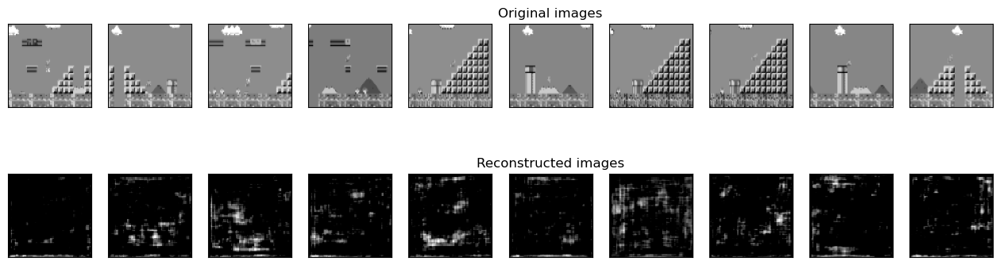

  1%|          | 1/100 [01:15<2:04:49, 75.65s/it]

epoch, train loss:  0 11290.044625
Avg VAE/SIAM loss:  10212.627390625 0.7363763864040375


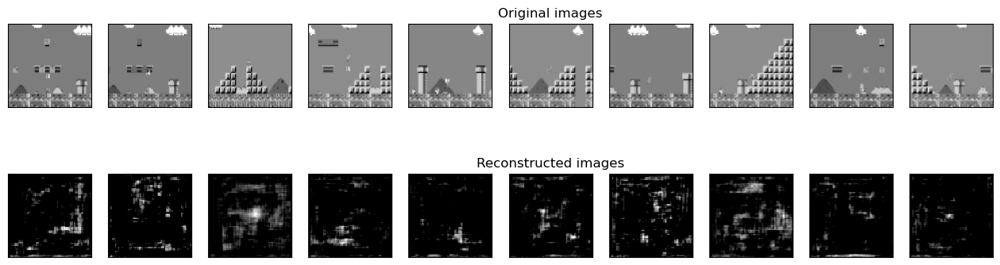

  2%|▏         | 2/100 [02:26<1:59:21, 73.08s/it]

epoch, train loss:  1 11317.1919921875
Avg VAE/SIAM loss:  10087.55034375 0.7973660070896149


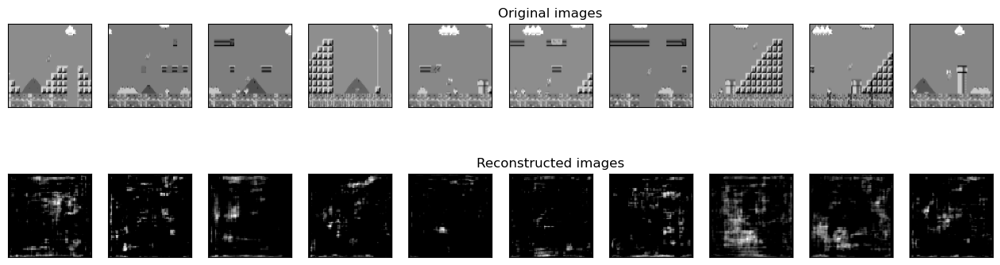

  3%|▎         | 3/100 [03:37<1:56:26, 72.03s/it]

epoch, train loss:  2 11283.599359375
Avg VAE/SIAM loss:  10154.3599609375 0.8514919877052307


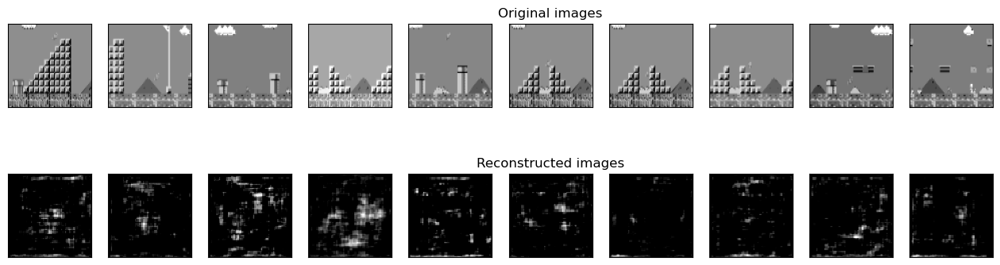

  4%|▍         | 4/100 [04:49<1:55:21, 72.10s/it]

epoch, train loss:  3 11431.5979609375
Avg VAE/SIAM loss:  10137.51696875 0.6949252870082855


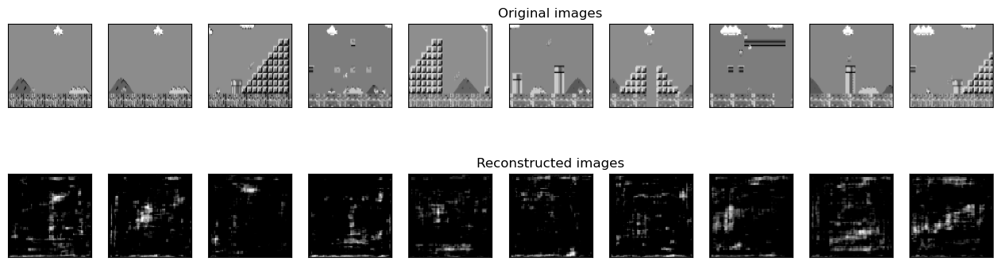

  5%|▌         | 5/100 [06:01<1:53:40, 71.79s/it]

epoch, train loss:  4 11179.9049140625
Avg VAE/SIAM loss:  10224.1749609375 0.7304783542156219


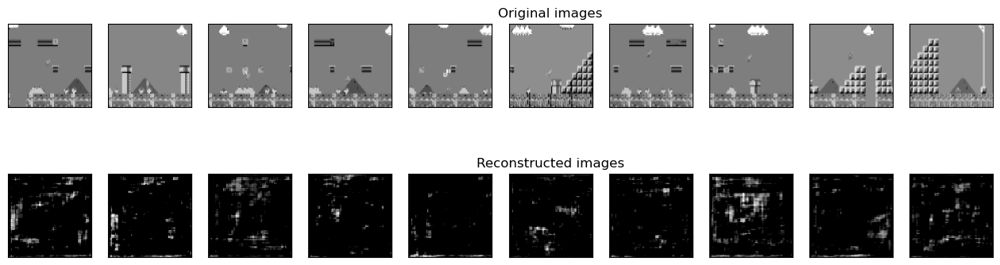

  6%|▌         | 6/100 [07:09<1:50:52, 70.78s/it]

epoch, train loss:  5 11319.892515625
Avg VAE/SIAM loss:  10224.3612421875 0.8406030406951904


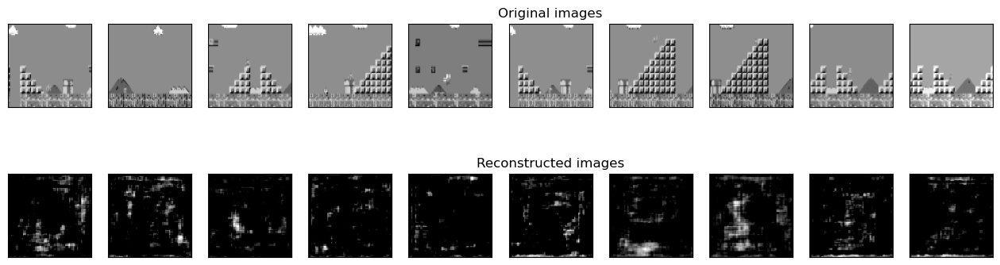

  7%|▋         | 7/100 [08:16<1:47:24, 69.29s/it]

epoch, train loss:  6 11485.2658046875
Avg VAE/SIAM loss:  10174.0215 0.8135292000770569


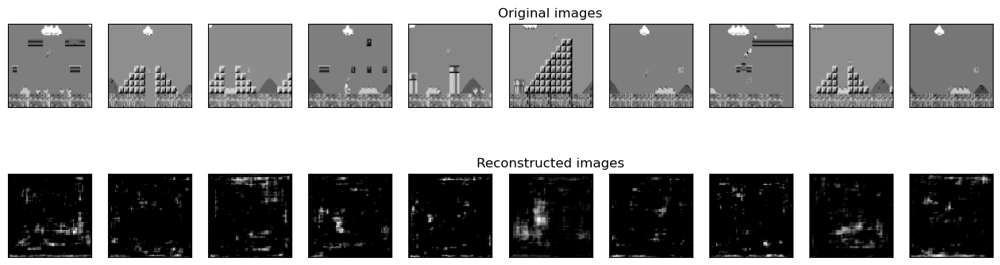

  8%|▊         | 8/100 [09:21<1:44:23, 68.08s/it]

epoch, train loss:  7 11394.31528125
Avg VAE/SIAM loss:  10204.36765625 0.6956599388122559


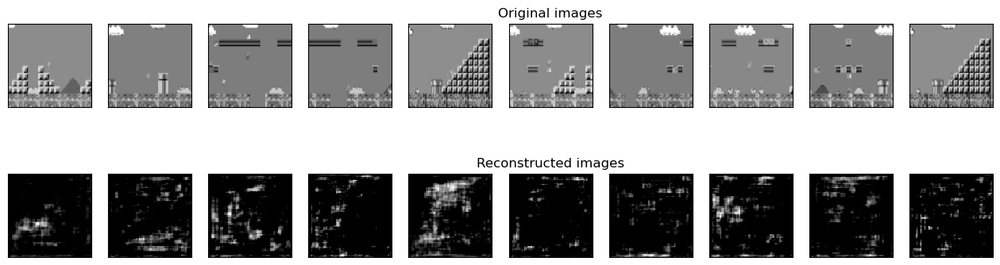

  9%|▉         | 9/100 [10:27<1:42:12, 67.38s/it]

epoch, train loss:  8 11247.857515625
Avg VAE/SIAM loss:  10161.17021875 0.7790829864740372


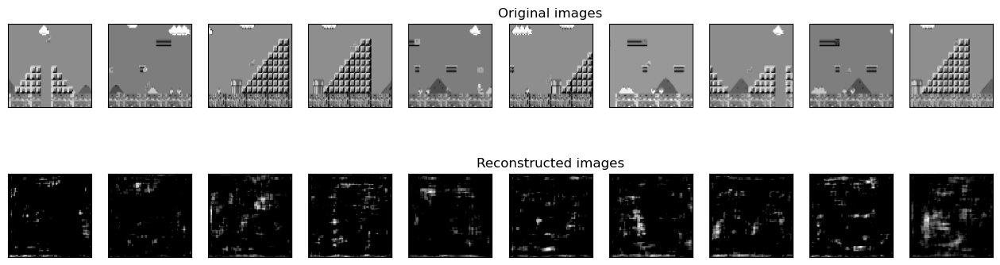

 10%|█         | 10/100 [11:33<1:40:18, 66.88s/it]

epoch, train loss:  9 11329.7947265625
Avg VAE/SIAM loss:  10206.9956015625 0.775577050447464


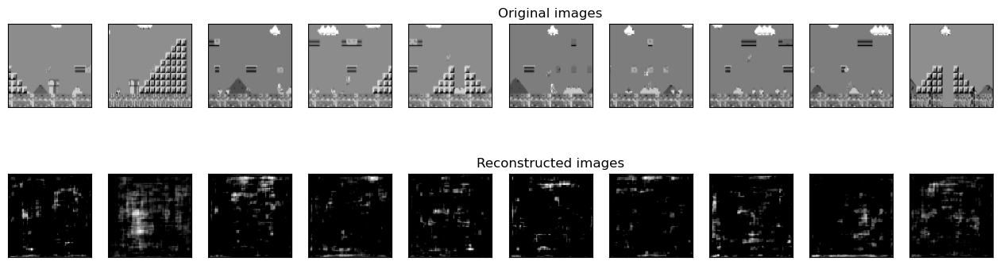

 11%|█         | 11/100 [12:39<1:38:44, 66.57s/it]

epoch, train loss:  10 11370.3611484375
Avg VAE/SIAM loss:  10083.223578125 0.8197584875822067


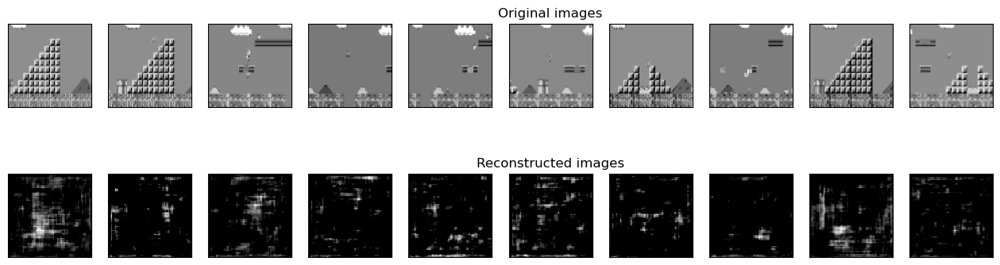

 12%|█▏        | 12/100 [13:45<1:37:26, 66.44s/it]

epoch, train loss:  11 11312.861328125
Avg VAE/SIAM loss:  10120.85246875 0.788337799191475


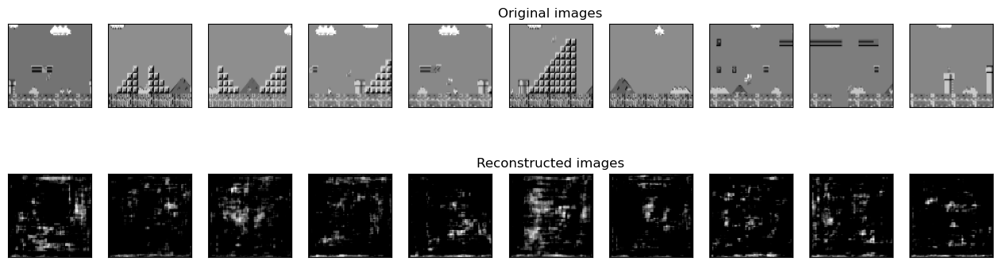

 13%|█▎        | 13/100 [14:52<1:36:30, 66.56s/it]

epoch, train loss:  12 11303.359171875
Avg VAE/SIAM loss:  10159.6473515625 0.797013585805893


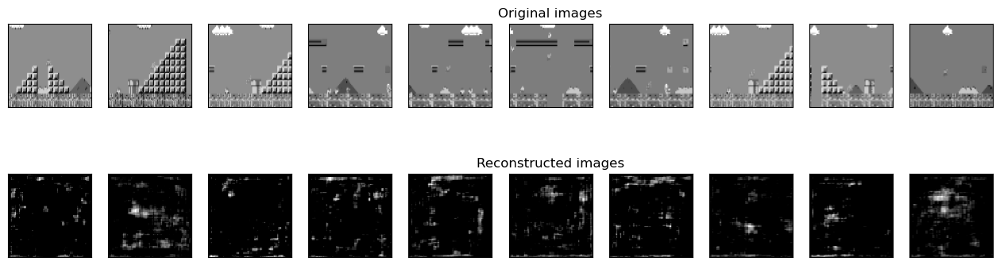

 14%|█▍        | 14/100 [16:01<1:36:31, 67.34s/it]

epoch, train loss:  13 11355.1677421875
Avg VAE/SIAM loss:  10114.085890625 0.8118244290351868


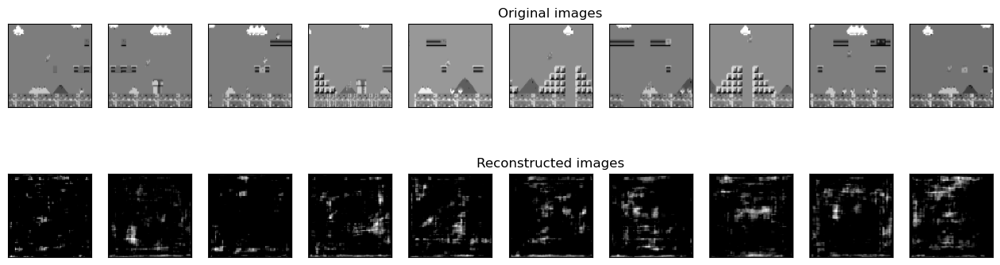

 15%|█▌        | 15/100 [17:08<1:35:09, 67.17s/it]

epoch, train loss:  14 11331.8225078125
Avg VAE/SIAM loss:  10184.27125 0.705078920841217


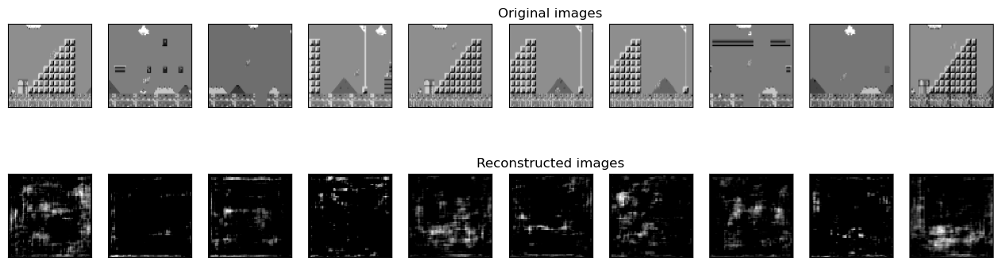

 16%|█▌        | 16/100 [18:13<1:33:27, 66.76s/it]

epoch, train loss:  15 11241.889625
Avg VAE/SIAM loss:  10194.6340703125 0.7477554525732995


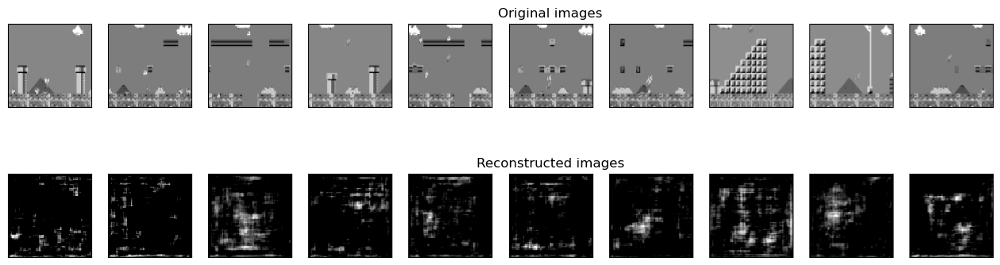

 17%|█▋        | 17/100 [19:19<1:31:56, 66.46s/it]

epoch, train loss:  16 11316.26728125
Avg VAE/SIAM loss:  10243.518234375 0.8151415865421295


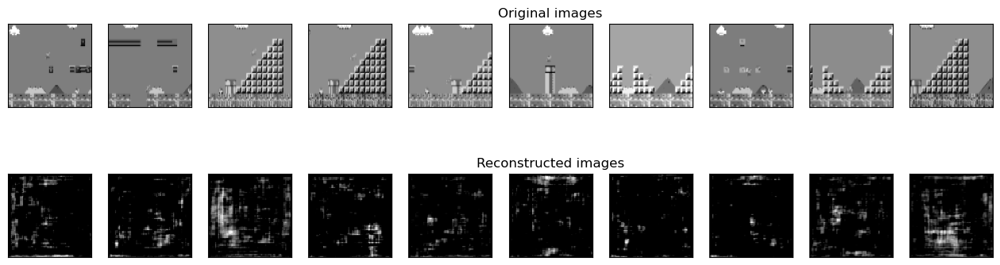

 18%|█▊        | 18/100 [20:25<1:30:40, 66.35s/it]

epoch, train loss:  17 11466.2306015625
Avg VAE/SIAM loss:  10114.6391484375 0.7445389518737793


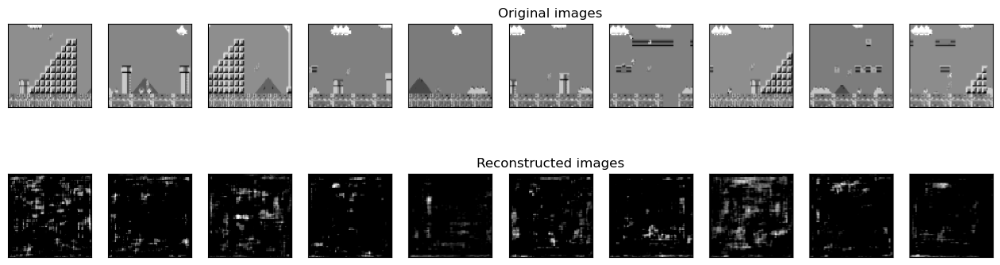

 19%|█▉        | 19/100 [21:31<1:29:16, 66.13s/it]

epoch, train loss:  18 11231.44759375
Avg VAE/SIAM loss:  10128.1159765625 0.8015837025642395


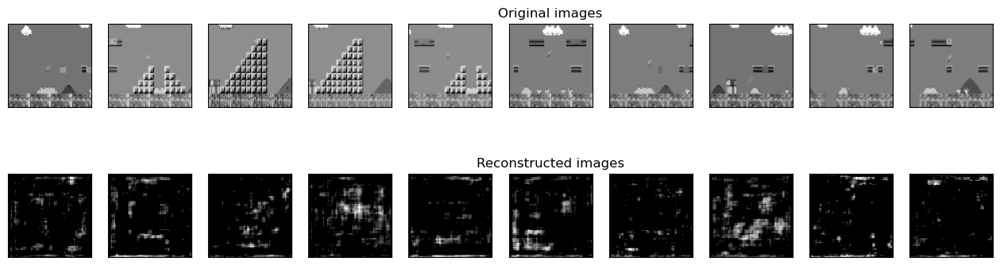

 20%|██        | 20/100 [22:36<1:27:58, 65.99s/it]

epoch, train loss:  19 11330.4915390625
Avg VAE/SIAM loss:  10134.3208515625 0.8028516941070557


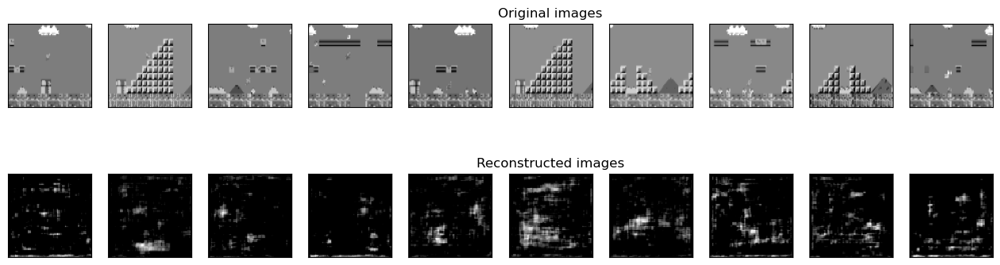

 21%|██        | 21/100 [23:42<1:26:52, 65.98s/it]

epoch, train loss:  20 11338.5983984375
Avg VAE/SIAM loss:  10169.7907265625 0.7303041839599609


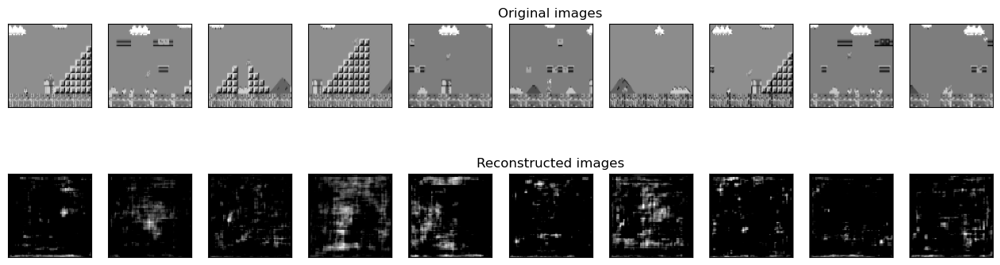

 22%|██▏       | 22/100 [24:48<1:25:40, 65.91s/it]

epoch, train loss:  21 11265.2470234375
Avg VAE/SIAM loss:  10176.10453125 0.8384697270393372


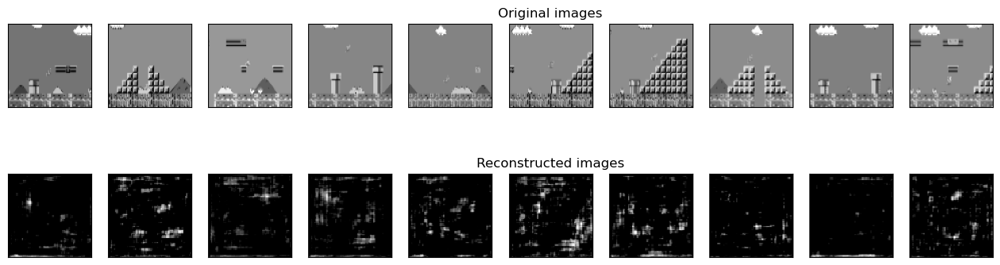

 23%|██▎       | 23/100 [25:54<1:24:26, 65.80s/it]

epoch, train loss:  22 11433.809109375
Avg VAE/SIAM loss:  10147.6102890625 0.8062440149784088


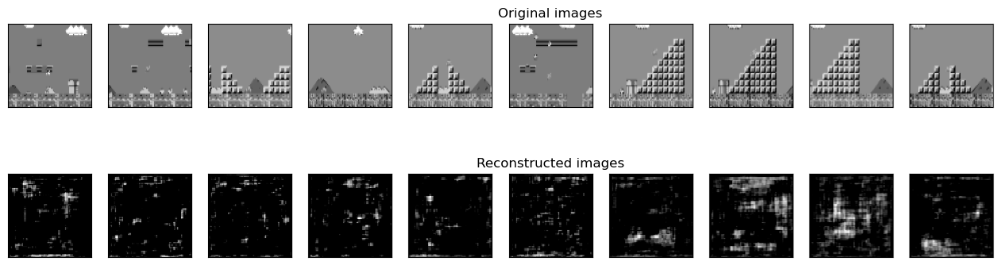

 24%|██▍       | 24/100 [26:59<1:23:12, 65.69s/it]

epoch, train loss:  23 11356.976328125
Avg VAE/SIAM loss:  10159.84396875 0.7261931791305541


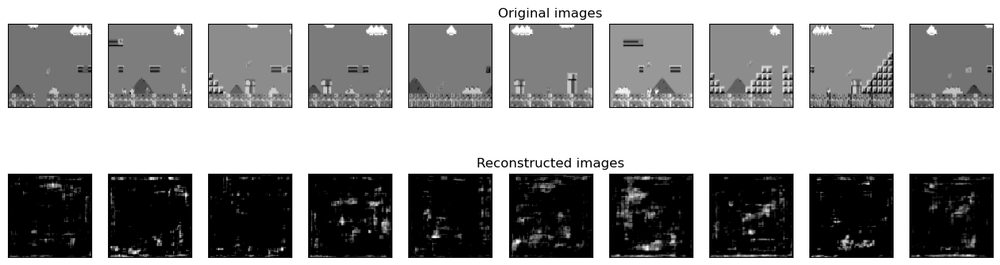

 25%|██▌       | 25/100 [28:05<1:22:13, 65.78s/it]

epoch, train loss:  24 11249.13375
Avg VAE/SIAM loss:  10176.3394375 0.8407417197227478


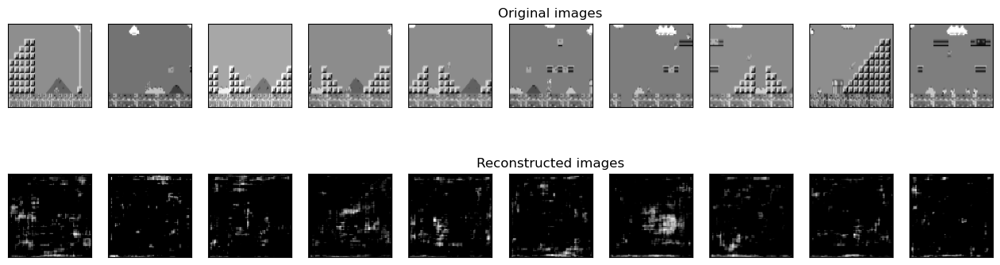

 26%|██▌       | 26/100 [29:11<1:21:01, 65.69s/it]

epoch, train loss:  25 11437.4520546875
Avg VAE/SIAM loss:  10117.2134375 0.8125183557271958


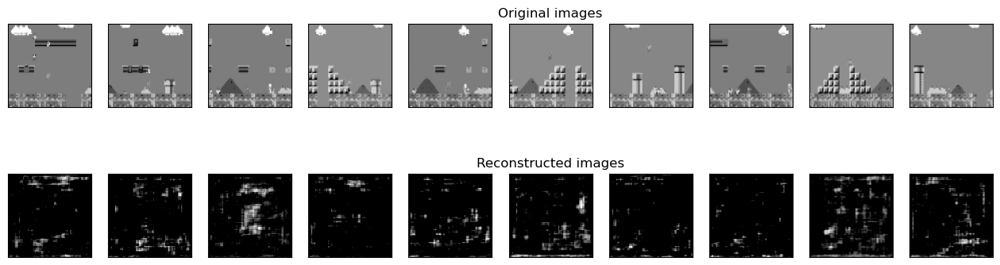

 27%|██▋       | 27/100 [30:16<1:19:55, 65.69s/it]

epoch, train loss:  26 11335.99096875
Avg VAE/SIAM loss:  10137.7032734375 0.7400312612056732


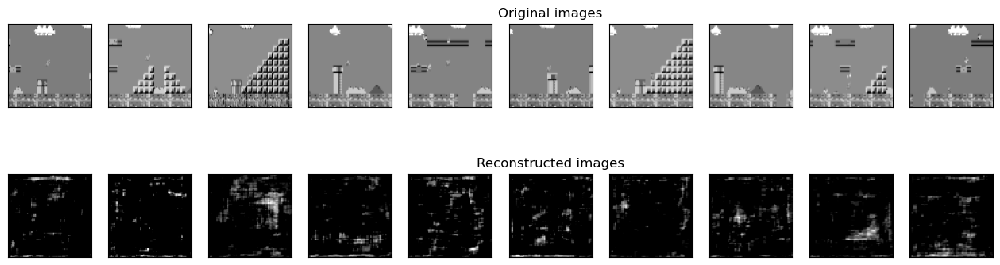

 28%|██▊       | 28/100 [31:22<1:18:47, 65.66s/it]

epoch, train loss:  27 11247.750171875
Avg VAE/SIAM loss:  10194.6042734375 0.8695989143252373


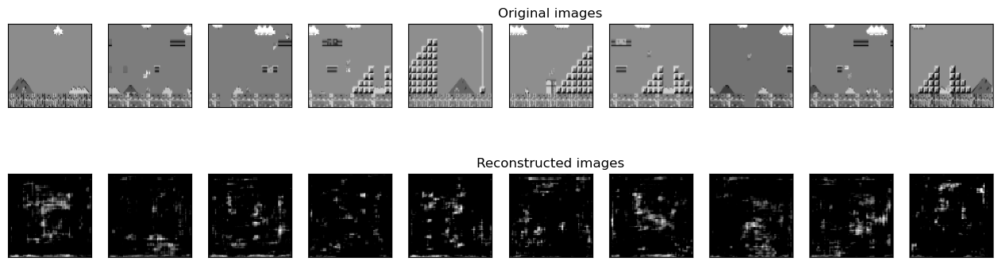

 29%|██▉       | 29/100 [32:27<1:17:38, 65.61s/it]

epoch, train loss:  28 11499.0026796875
Avg VAE/SIAM loss:  10243.08034375 0.7595121409893036


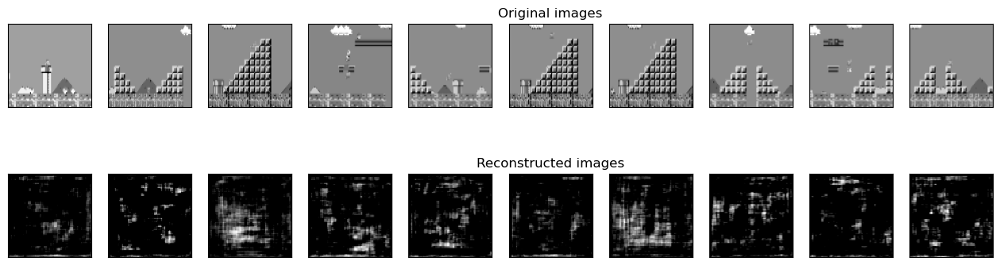

 30%|███       | 30/100 [33:33<1:16:34, 65.64s/it]

epoch, train loss:  29 11382.3485859375
Avg VAE/SIAM loss:  10151.4663359375 0.7982677915096283


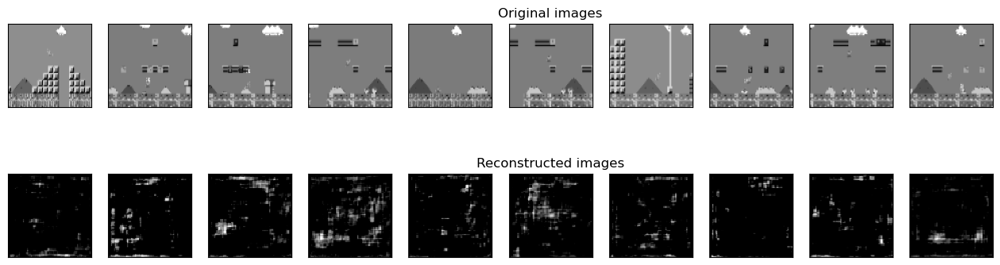

 31%|███       | 31/100 [34:39<1:15:27, 65.61s/it]

epoch, train loss:  30 11348.8680390625
Avg VAE/SIAM loss:  10169.020546875 0.7851830661296845


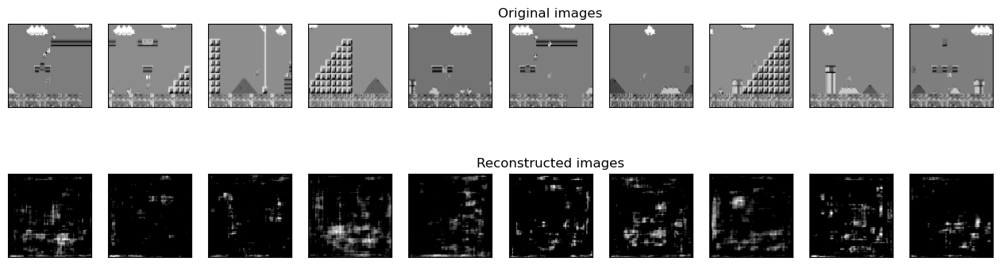

 32%|███▏      | 32/100 [35:44<1:14:22, 65.63s/it]

epoch, train loss:  31 11346.795171875
Avg VAE/SIAM loss:  10246.6700390625 0.773626249909401


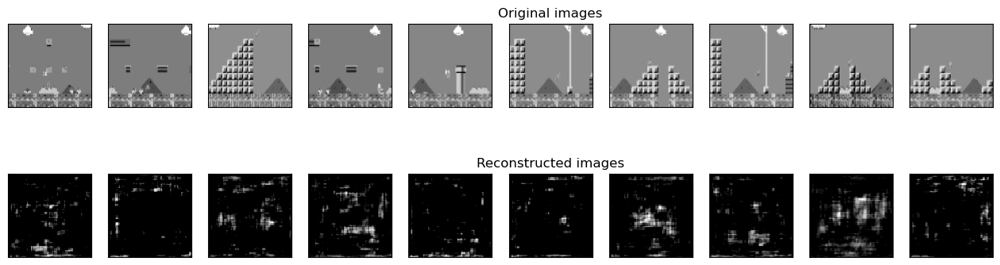

 33%|███▎      | 33/100 [36:51<1:13:36, 65.92s/it]

epoch, train loss:  32 11407.10940625
Avg VAE/SIAM loss:  10198.290421875 0.818977345585823


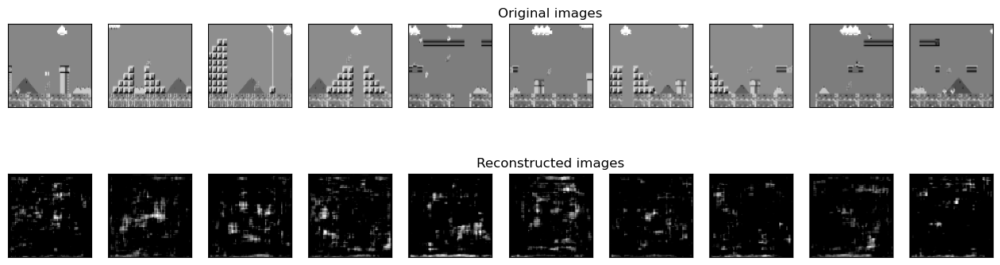

 34%|███▍      | 34/100 [37:57<1:12:33, 65.96s/it]

epoch, train loss:  33 11426.756421875
Avg VAE/SIAM loss:  10085.7027734375 0.7555109348297119


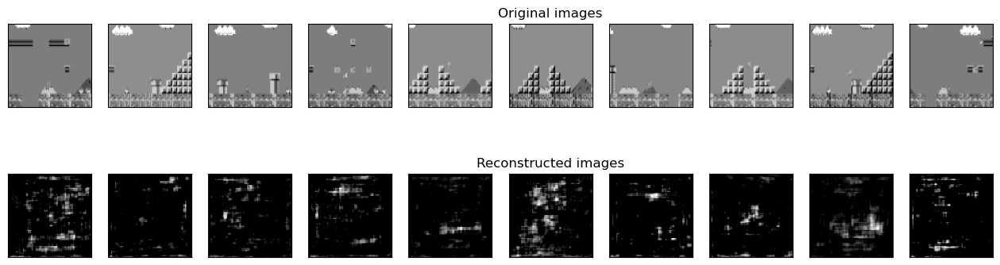

 35%|███▌      | 35/100 [39:02<1:11:18, 65.82s/it]

epoch, train loss:  34 11218.9691796875
Avg VAE/SIAM loss:  10099.21903125 0.7169633303880691


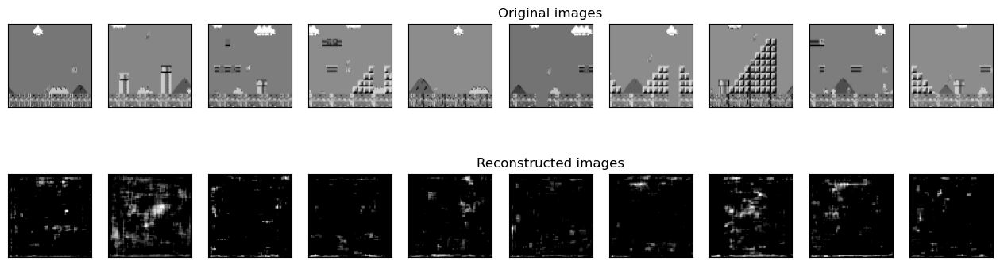

 36%|███▌      | 36/100 [40:08<1:10:05, 65.72s/it]

epoch, train loss:  35 11174.664015625
Avg VAE/SIAM loss:  10136.9457265625 0.7464707870483398


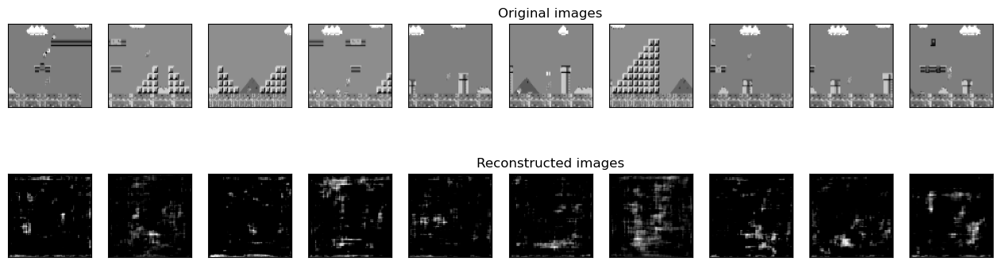

 37%|███▋      | 37/100 [41:14<1:08:58, 65.70s/it]

epoch, train loss:  36 11256.651921875
Avg VAE/SIAM loss:  10172.48909375 0.772630488216877


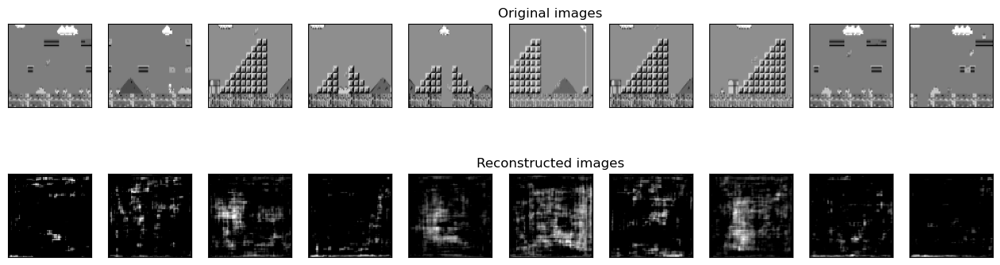

 38%|███▊      | 38/100 [42:19<1:07:56, 65.75s/it]

epoch, train loss:  37 11331.4348359375
Avg VAE/SIAM loss:  10149.822796875 0.8052880006432533


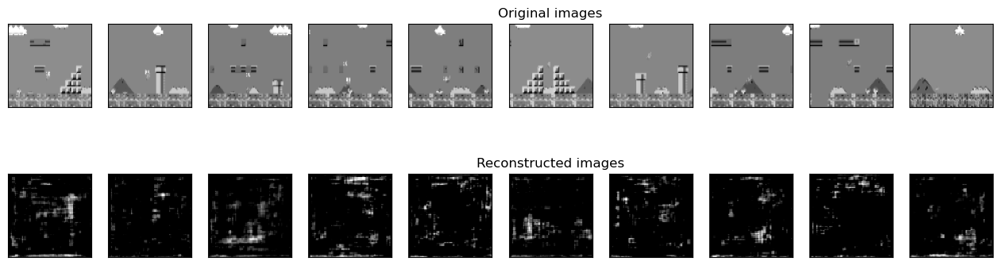

 39%|███▉      | 39/100 [43:25<1:06:48, 65.71s/it]

epoch, train loss:  38 11357.75478125
Avg VAE/SIAM loss:  10143.3775390625 0.702063083410263


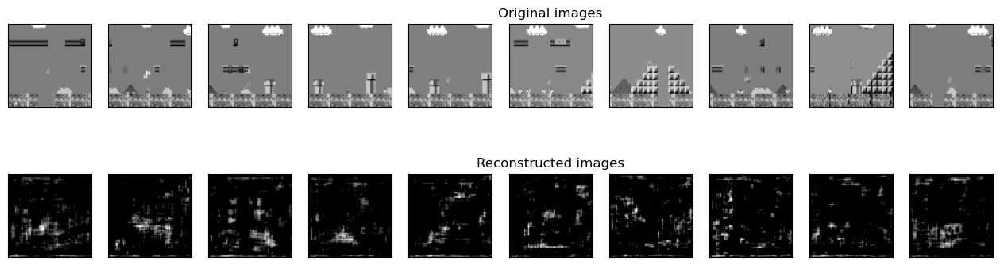

 40%|████      | 40/100 [44:31<1:05:43, 65.72s/it]

epoch, train loss:  39 11196.472140625
Avg VAE/SIAM loss:  10197.2933515625 0.7891727328300476


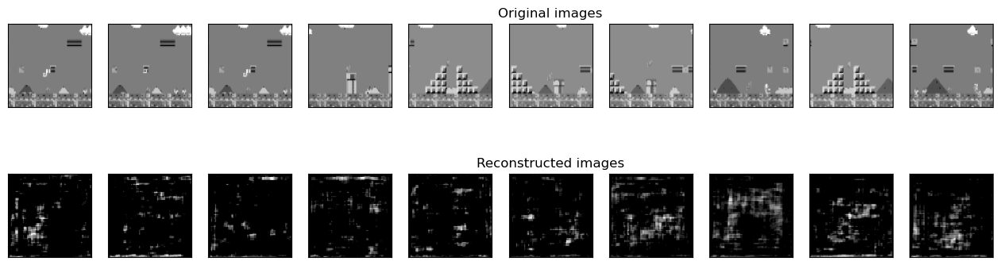

 41%|████      | 41/100 [45:36<1:04:35, 65.68s/it]

epoch, train loss:  40 11381.052484375
Avg VAE/SIAM loss:  10237.60859375 0.7117505893707275


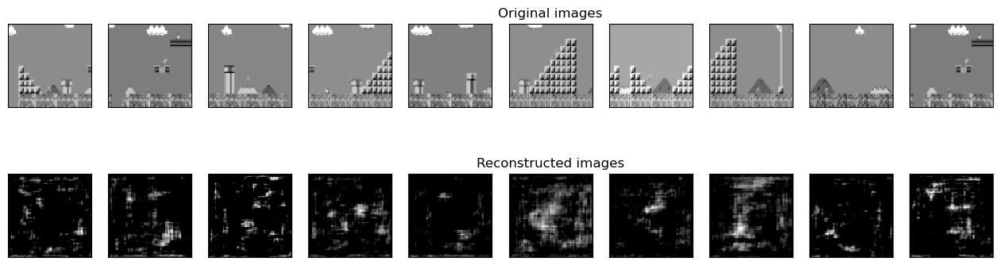

 42%|████▏     | 42/100 [46:42<1:03:30, 65.69s/it]

epoch, train loss:  41 11305.2344609375
Avg VAE/SIAM loss:  10136.0154921875 0.7448698122501374


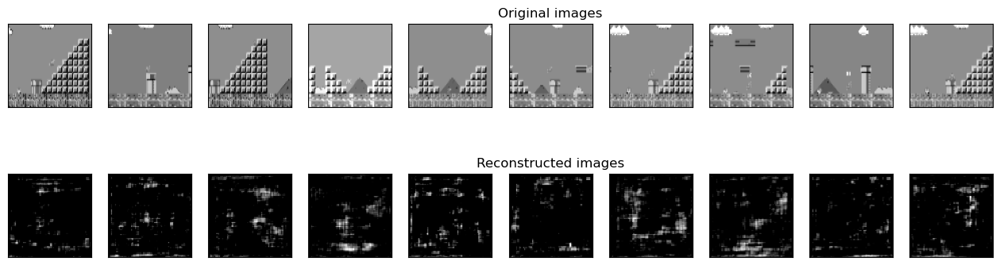

 43%|████▎     | 43/100 [47:48<1:02:30, 65.79s/it]

epoch, train loss:  42 11253.3201796875
Avg VAE/SIAM loss:  10173.46015625 0.7550489799976349


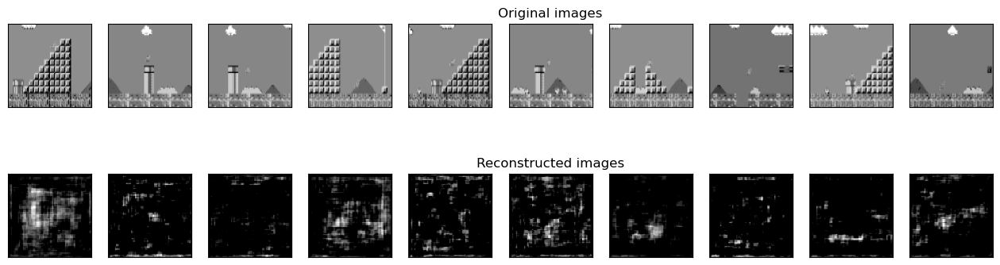

 44%|████▍     | 44/100 [48:54<1:01:17, 65.68s/it]

epoch, train loss:  43 11306.033609375
Avg VAE/SIAM loss:  10204.5501875 0.7566993560791015


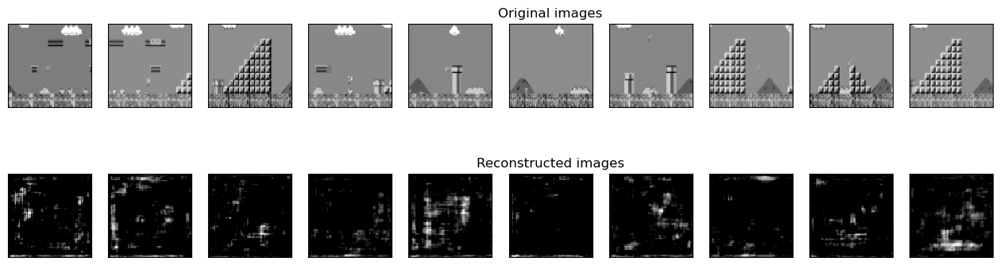

 45%|████▌     | 45/100 [49:59<1:00:15, 65.75s/it]

epoch, train loss:  44 11339.5992421875
Avg VAE/SIAM loss:  10126.455984375 0.7797201229333878


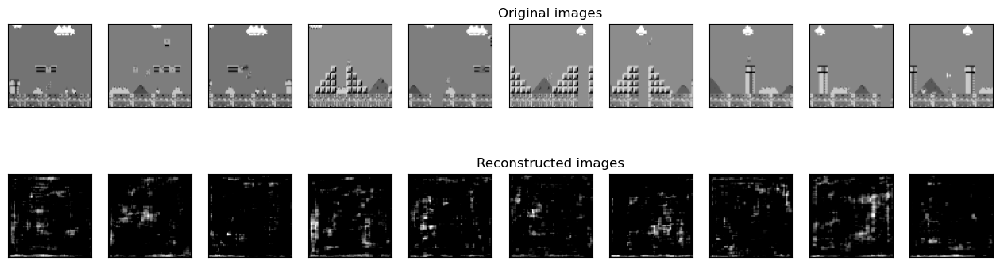

 46%|████▌     | 46/100 [51:05<59:08, 65.71s/it]  

epoch, train loss:  45 11296.0361796875
Avg VAE/SIAM loss:  10150.2521953125 0.7717871959209442


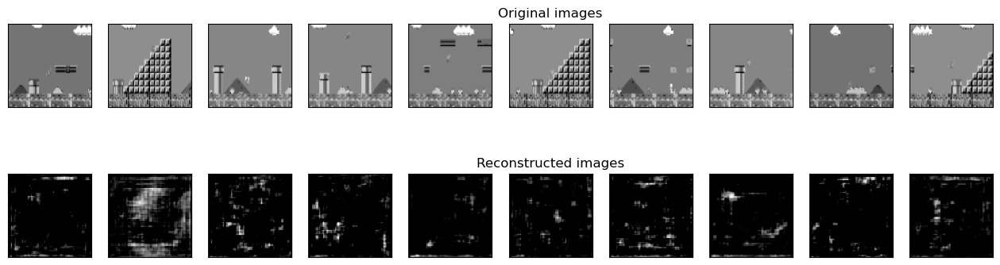

 47%|████▋     | 47/100 [52:11<57:59, 65.65s/it]

epoch, train loss:  46 11307.9329296875
Avg VAE/SIAM loss:  10123.7429609375 0.7025218338966369


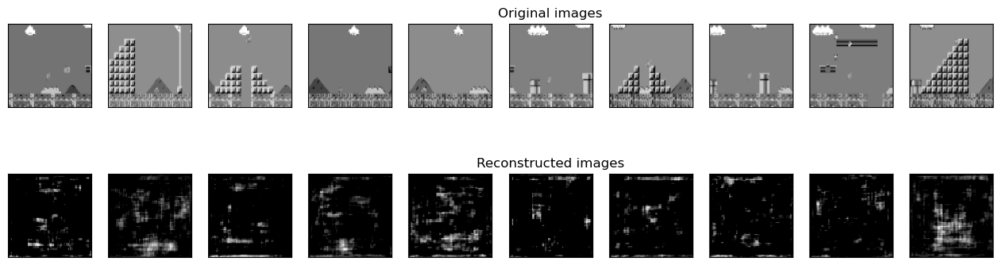

 48%|████▊     | 48/100 [53:16<56:55, 65.68s/it]

epoch, train loss:  47 11177.5257421875
Avg VAE/SIAM loss:  10210.4552734375 0.7385188024044037


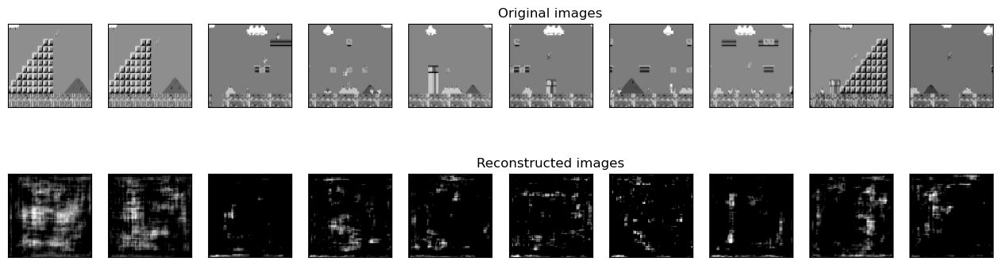

 49%|████▉     | 49/100 [54:22<55:50, 65.70s/it]

epoch, train loss:  48 11318.2334765625
Avg VAE/SIAM loss:  10201.490046875 0.7912805001735688


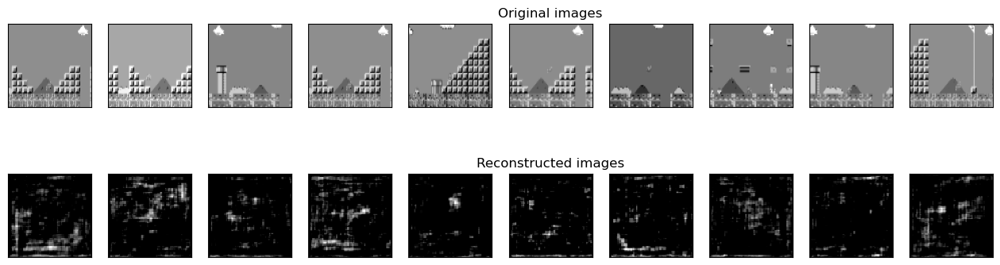

 50%|█████     | 50/100 [55:28<54:48, 65.77s/it]

epoch, train loss:  49 11388.4107890625
Avg VAE/SIAM loss:  10162.903828125 0.8595136725902557


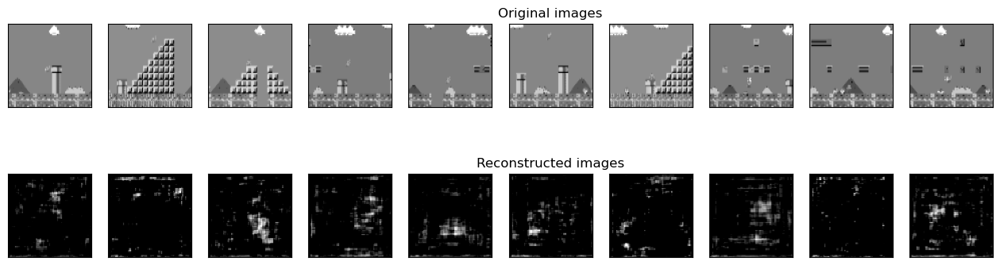

 51%|█████     | 51/100 [56:34<53:37, 65.67s/it]

epoch, train loss:  50 11452.174390625
Avg VAE/SIAM loss:  10082.2747578125 0.8529664759635925


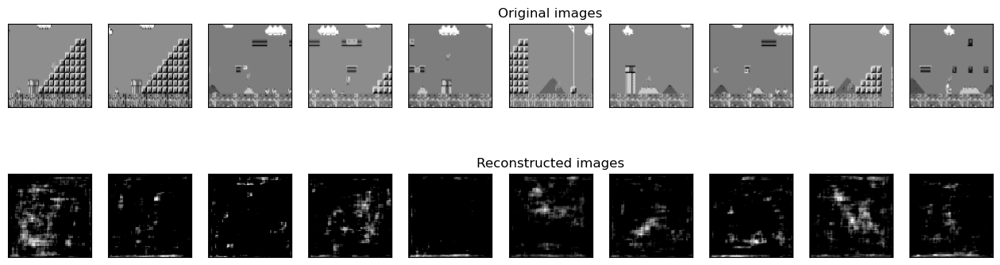

 52%|█████▏    | 52/100 [57:39<52:30, 65.64s/it]

epoch, train loss:  51 11361.72446875
Avg VAE/SIAM loss:  10160.498125 0.7795320098400116


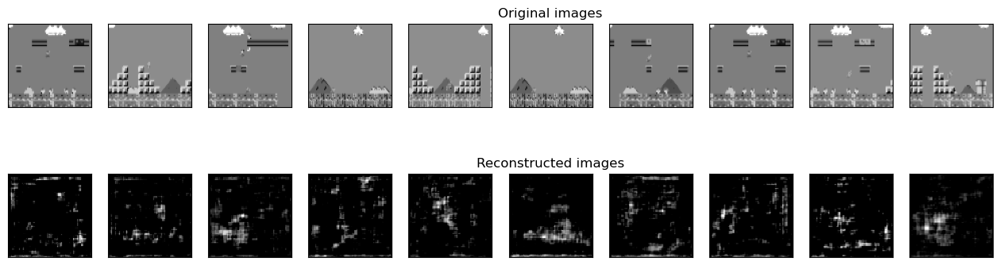

 53%|█████▎    | 53/100 [58:47<51:56, 66.31s/it]

epoch, train loss:  52 11329.796140625
Avg VAE/SIAM loss:  10132.76853125 0.7618601965904236


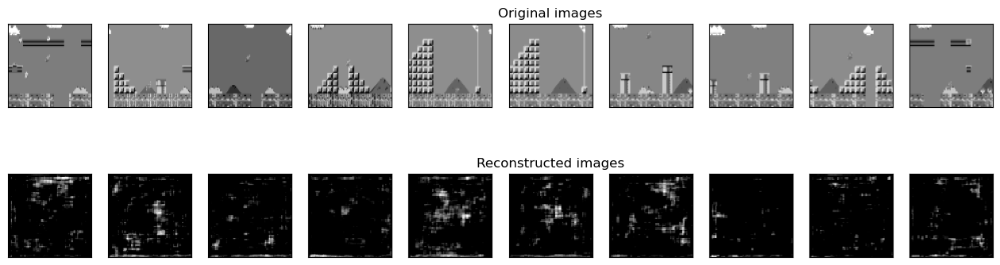

 54%|█████▍    | 54/100 [59:57<51:36, 67.31s/it]

epoch, train loss:  53 11275.5588203125
Avg VAE/SIAM loss:  10226.14903125 0.7456531128883361


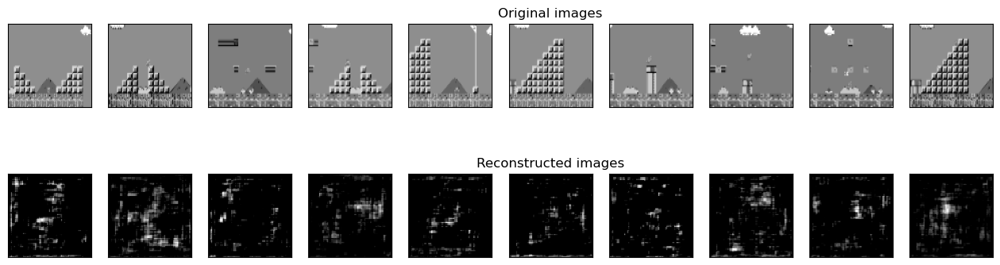

 55%|█████▌    | 55/100 [1:01:05<50:37, 67.50s/it]

epoch, train loss:  54 11344.6286953125
Avg VAE/SIAM loss:  10193.2354296875 0.7629392912387848


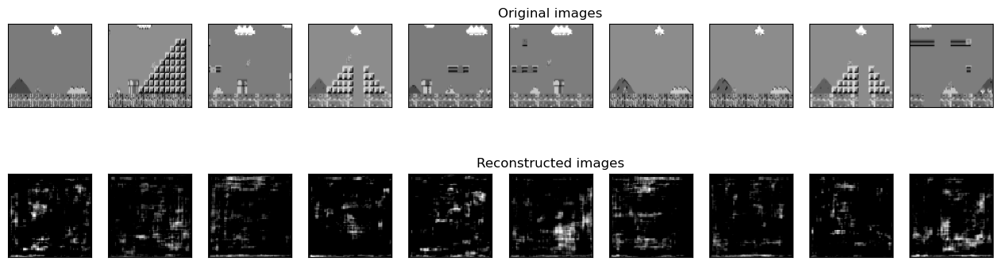

 56%|█████▌    | 56/100 [1:02:12<49:35, 67.61s/it]

epoch, train loss:  55 11337.644390625
Avg VAE/SIAM loss:  10124.959578125 0.7459452658295631


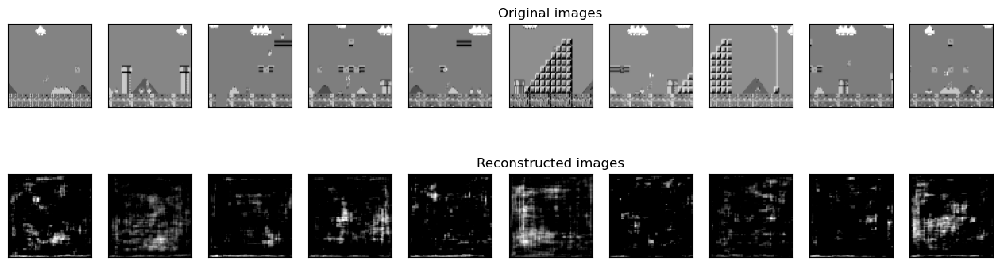

 57%|█████▋    | 57/100 [1:03:20<48:26, 67.59s/it]

epoch, train loss:  56 11243.8775
Avg VAE/SIAM loss:  10165.4588359375 0.7749220268726349


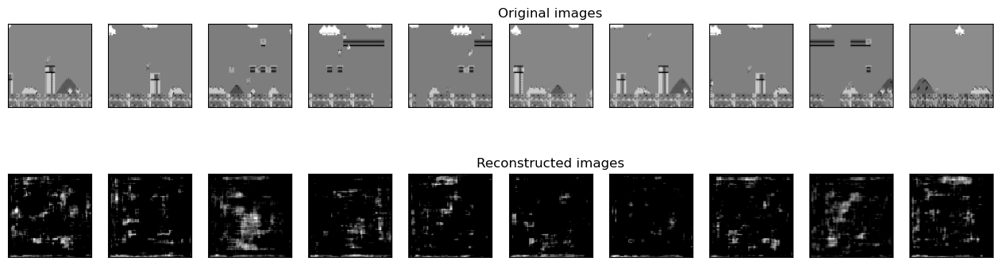

 58%|█████▊    | 58/100 [1:04:26<46:55, 67.04s/it]

epoch, train loss:  57 11327.8418515625
Avg VAE/SIAM loss:  10195.006046875 0.8297862541675568


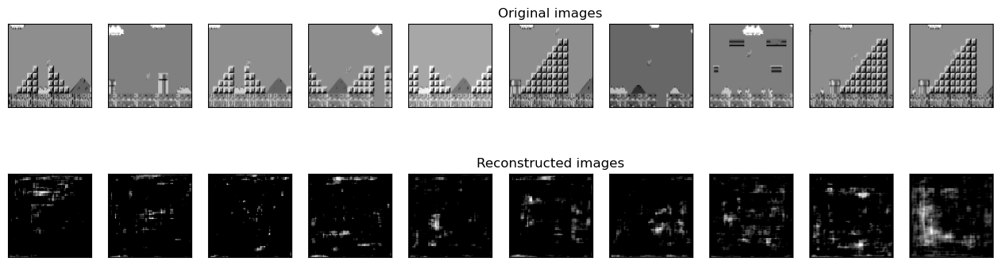

 59%|█████▉    | 59/100 [1:05:31<45:31, 66.62s/it]

epoch, train loss:  58 11439.6854453125
Avg VAE/SIAM loss:  10102.7699375 0.7433214462399482


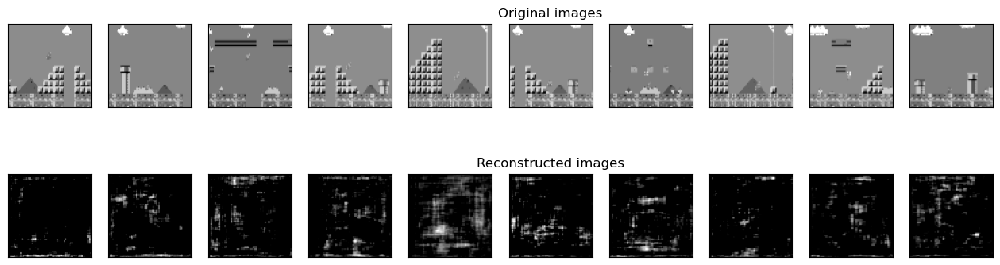

 60%|██████    | 60/100 [1:06:37<44:10, 66.26s/it]

epoch, train loss:  59 11217.752078125
Avg VAE/SIAM loss:  10220.9181875 0.772715713262558


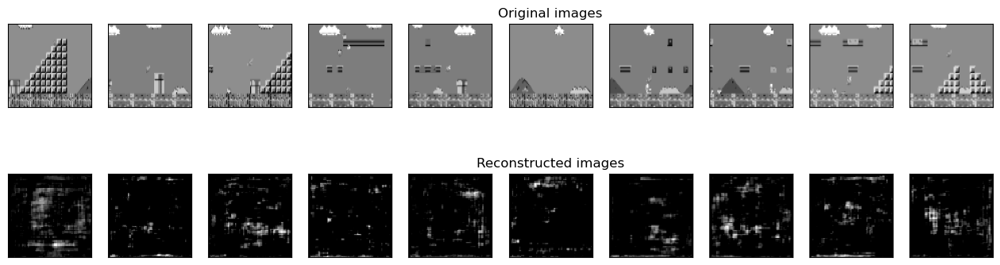

 61%|██████    | 61/100 [1:07:43<43:00, 66.17s/it]

epoch, train loss:  60 11379.99171875
Avg VAE/SIAM loss:  10266.921578125 0.7213819289207458


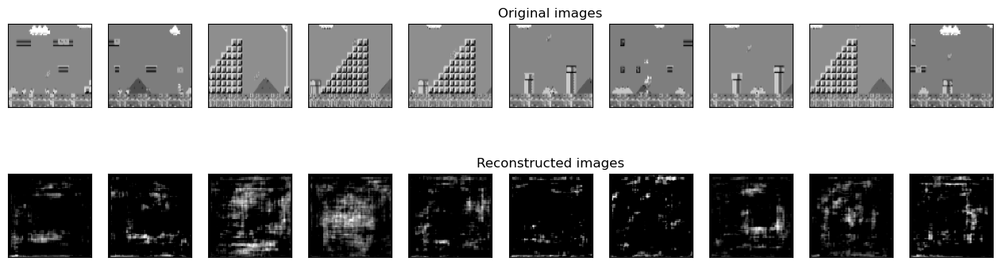

 62%|██████▏   | 62/100 [1:08:48<41:42, 65.84s/it]

epoch, train loss:  61 11348.99446875
Avg VAE/SIAM loss:  10248.1032734375 0.7196469664573669


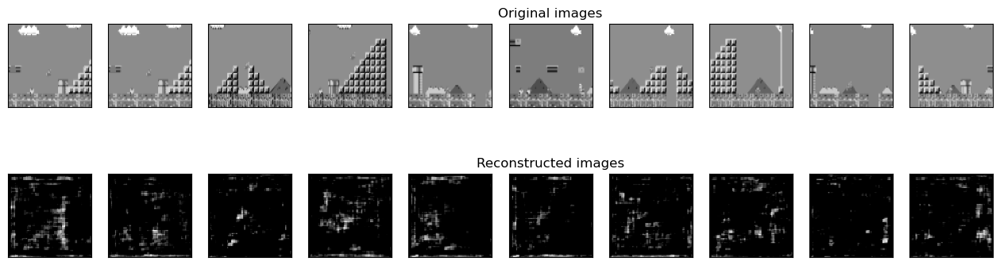

 63%|██████▎   | 63/100 [1:09:54<40:37, 65.89s/it]

epoch, train loss:  62 11327.5736875
Avg VAE/SIAM loss:  10152.0441328125 0.7191733388900757


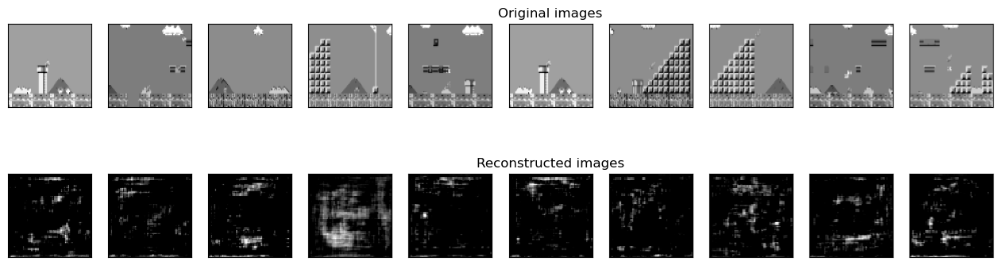

 64%|██████▍   | 64/100 [1:10:59<39:26, 65.72s/it]

epoch, train loss:  63 11230.804171875
Avg VAE/SIAM loss:  10144.433609375 0.7467023010253906


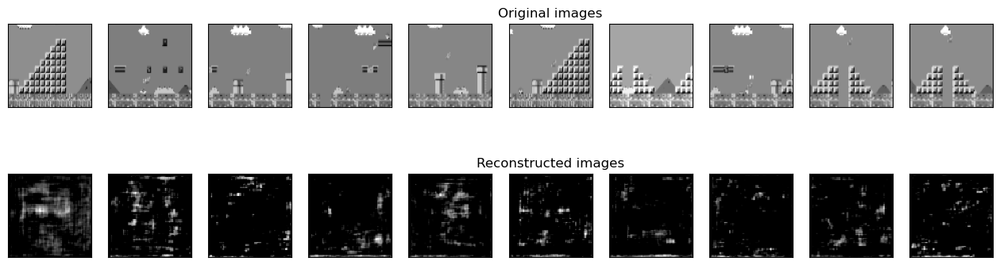

 65%|██████▌   | 65/100 [1:12:04<38:15, 65.59s/it]

epoch, train loss:  64 11264.4870390625
Avg VAE/SIAM loss:  10189.6113828125 0.8010196607112885


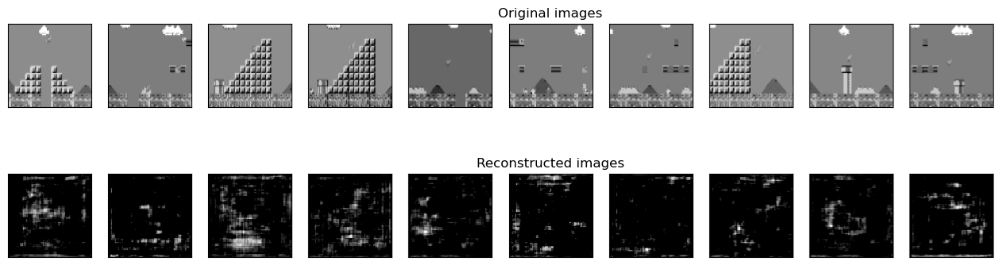

 66%|██████▌   | 66/100 [1:13:10<37:11, 65.62s/it]

epoch, train loss:  65 11391.1408203125
Avg VAE/SIAM loss:  10200.6364140625 0.7805042953491211


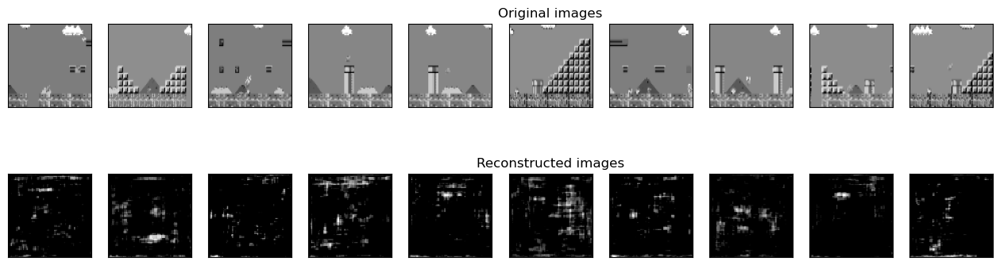

 67%|██████▋   | 67/100 [1:14:16<36:05, 65.63s/it]

epoch, train loss:  66 11371.3928671875
Avg VAE/SIAM loss:  10101.697546875 0.7507510862350464


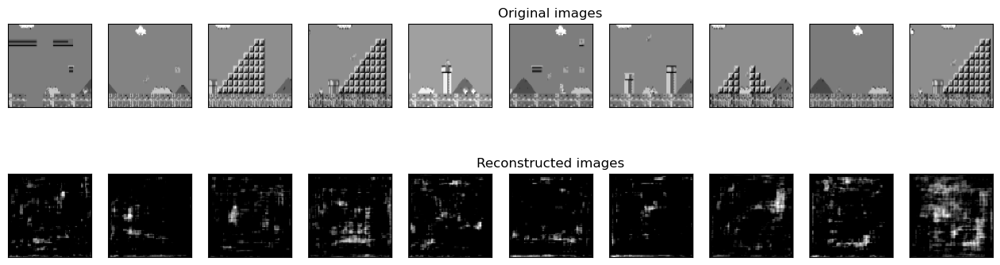

 68%|██████▊   | 68/100 [1:15:21<35:00, 65.65s/it]

epoch, train loss:  67 11227.8241953125
Avg VAE/SIAM loss:  10186.58521875 0.7686383998394013


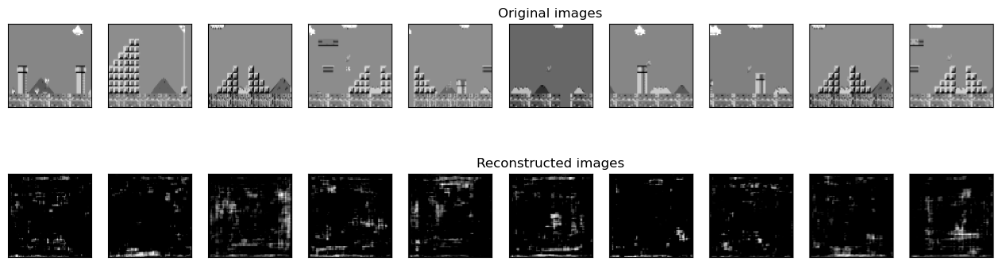

 69%|██████▉   | 69/100 [1:16:27<33:52, 65.57s/it]

epoch, train loss:  68 11339.5428359375
Avg VAE/SIAM loss:  10183.3377734375 0.774833459854126


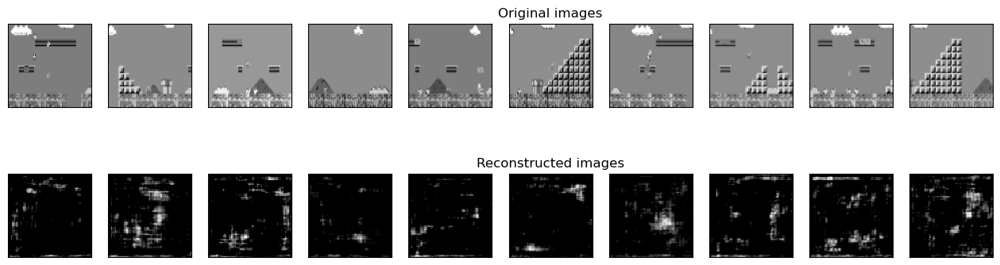

 70%|███████   | 70/100 [1:17:33<32:53, 65.79s/it]

epoch, train loss:  69 11345.5879296875
Avg VAE/SIAM loss:  10137.7291171875 0.7937741084098816


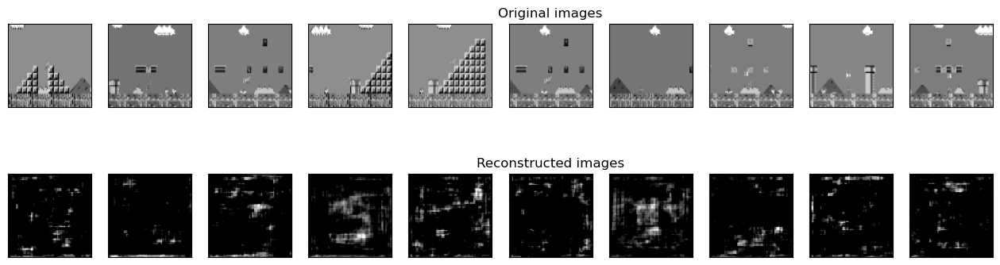

 71%|███████   | 71/100 [1:18:39<31:47, 65.78s/it]

epoch, train loss:  70 11328.3902890625
Avg VAE/SIAM loss:  10155.78815625 0.764410808801651


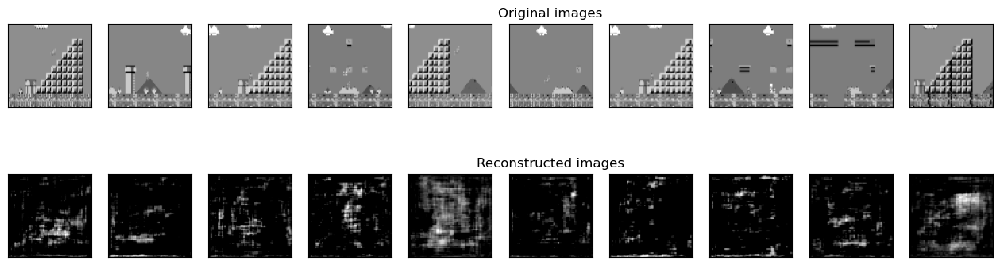

 72%|███████▏  | 72/100 [1:19:44<30:38, 65.66s/it]

epoch, train loss:  71 11302.404375
Avg VAE/SIAM loss:  10241.4173125 0.7758613350391388


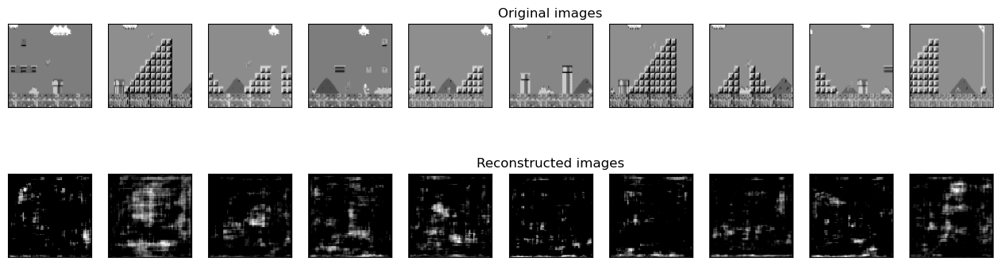

 73%|███████▎  | 73/100 [1:20:50<29:30, 65.57s/it]

epoch, train loss:  72 11405.2093203125
Avg VAE/SIAM loss:  10278.4351953125 0.8534787237644196


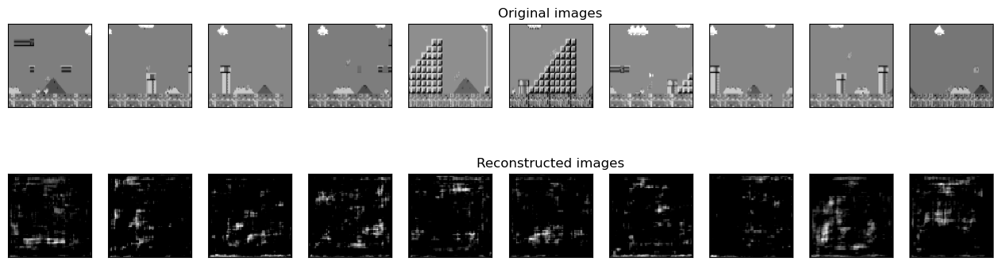

 74%|███████▍  | 74/100 [1:21:55<28:25, 65.58s/it]

epoch, train loss:  73 11558.6532734375
Avg VAE/SIAM loss:  10172.383765625 0.8293559858798981


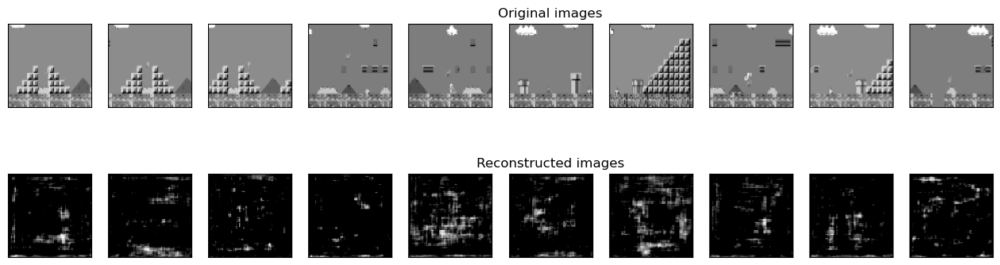

 75%|███████▌  | 75/100 [1:23:01<27:17, 65.49s/it]

epoch, train loss:  74 11416.4177109375
Avg VAE/SIAM loss:  10140.6286953125 0.8115692496299743


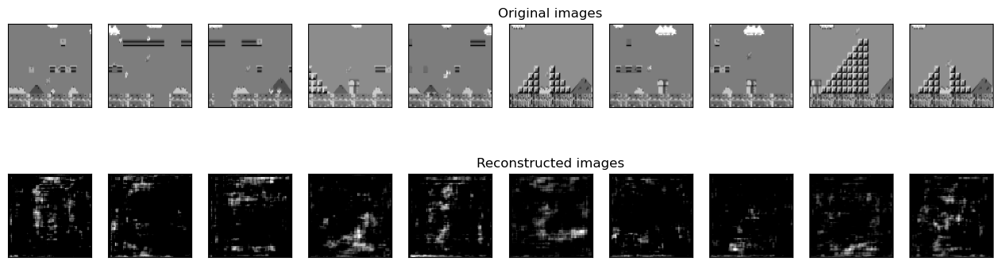

 76%|███████▌  | 76/100 [1:24:06<26:12, 65.53s/it]

epoch, train loss:  75 11357.982546875
Avg VAE/SIAM loss:  10141.7913671875 0.7640938475131989


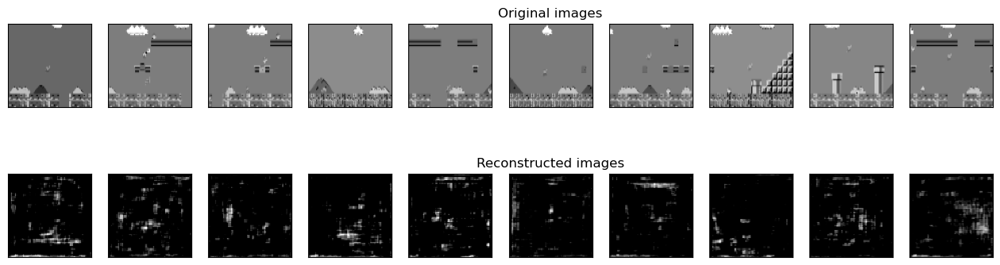

 77%|███████▋  | 77/100 [1:25:12<25:06, 65.48s/it]

epoch, train loss:  76 11287.9321328125
Avg VAE/SIAM loss:  10075.583125 0.7432859666347503


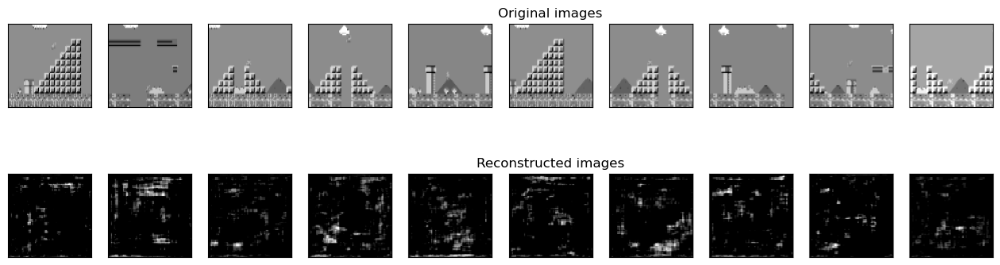

 78%|███████▊  | 78/100 [1:26:17<23:59, 65.44s/it]

epoch, train loss:  77 11190.5121015625
Avg VAE/SIAM loss:  10170.9277734375 0.6800420905351638


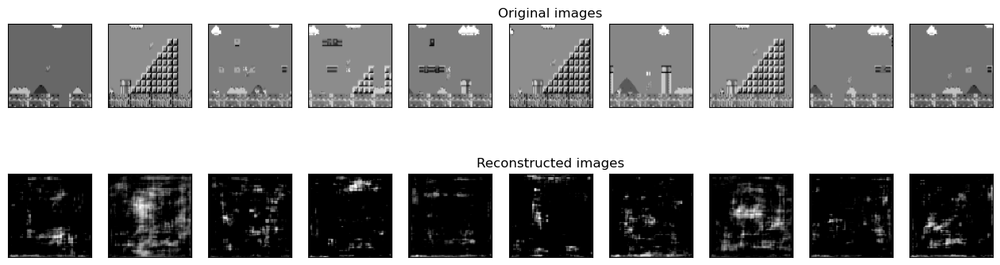

 79%|███████▉  | 79/100 [1:27:22<22:52, 65.37s/it]

epoch, train loss:  78 11190.990921875
Avg VAE/SIAM loss:  10214.2661953125 0.7722332592010498


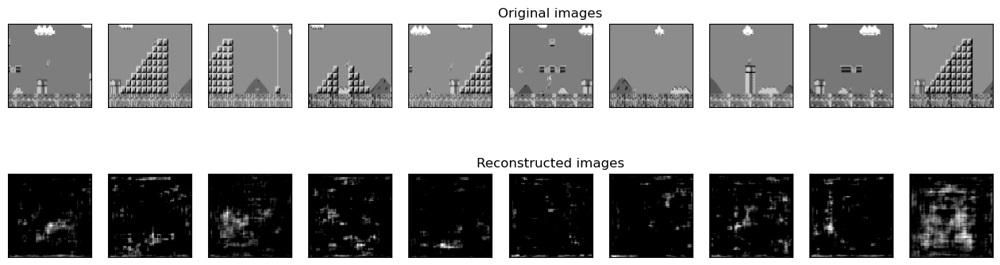

 80%|████████  | 80/100 [1:28:27<21:47, 65.36s/it]

epoch, train loss:  79 11372.616078125
Avg VAE/SIAM loss:  10178.0478125 0.7624004681110382


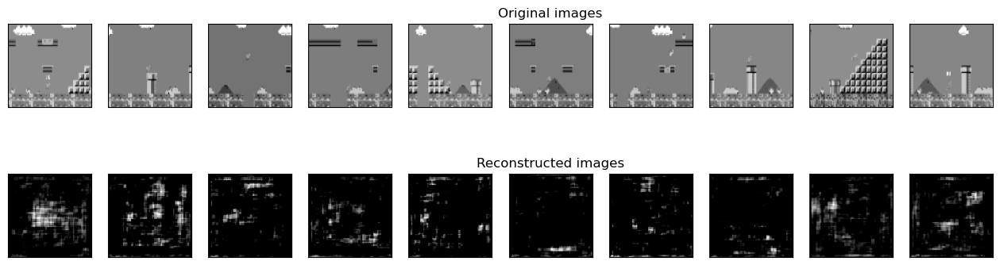

 81%|████████  | 81/100 [1:29:33<20:42, 65.41s/it]

epoch, train loss:  80 11321.6484921875
Avg VAE/SIAM loss:  10219.471203125 0.8946872971057892


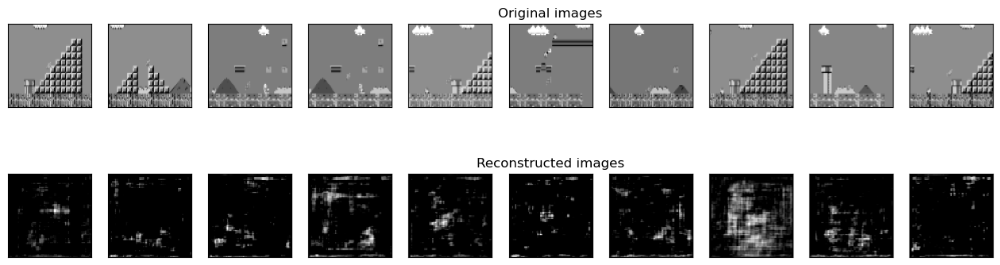

 82%|████████▏ | 82/100 [1:30:38<19:36, 65.39s/it]

epoch, train loss:  81 11561.5021484375
Avg VAE/SIAM loss:  10203.565328125 0.7165492312908173


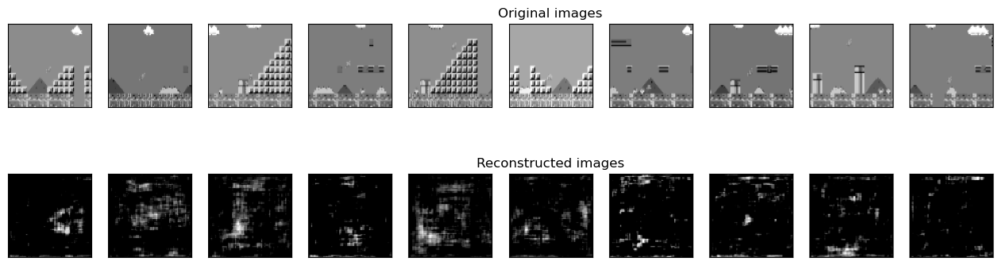

 83%|████████▎ | 83/100 [1:31:44<18:33, 65.48s/it]

epoch, train loss:  82 11278.3891796875
Avg VAE/SIAM loss:  10056.8605390625 0.7769630343914032


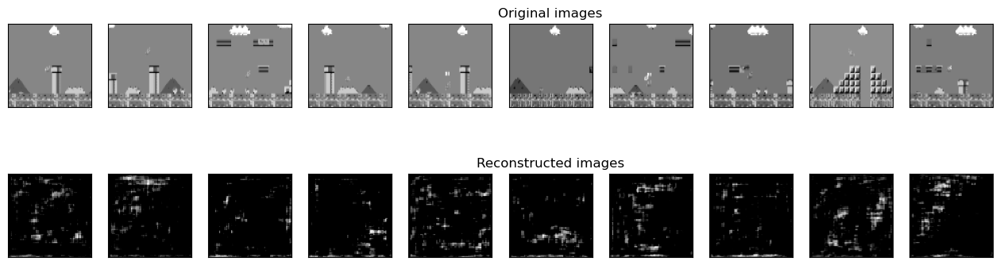

 84%|████████▍ | 84/100 [1:32:49<17:26, 65.40s/it]

epoch, train loss:  83 11222.3050234375
Avg VAE/SIAM loss:  10214.312390625 0.8979591172933579


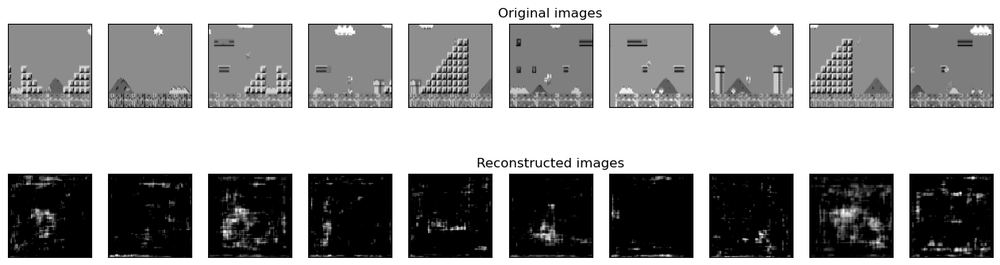

 85%|████████▌ | 85/100 [1:33:55<16:21, 65.41s/it]

epoch, train loss:  84 11561.2510390625
Avg VAE/SIAM loss:  10158.371375 0.777615530014038


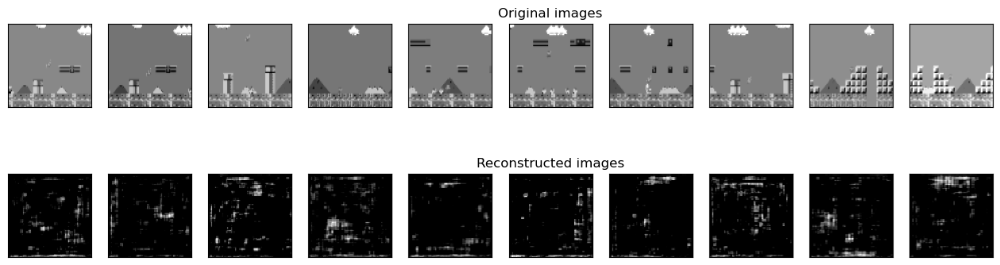

 86%|████████▌ | 86/100 [1:35:00<15:17, 65.50s/it]

epoch, train loss:  85 11324.794640625
Avg VAE/SIAM loss:  10216.3974765625 0.7937900646924972


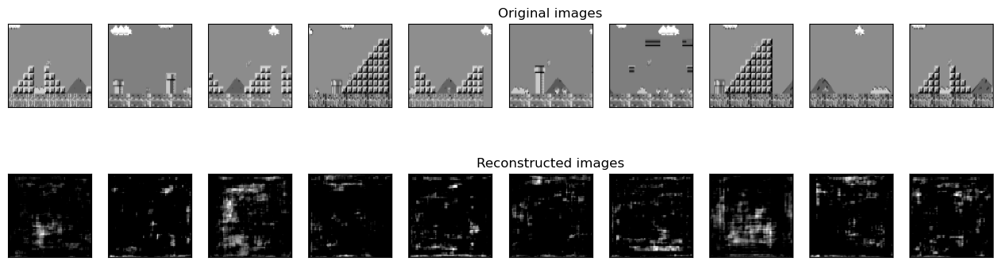

 87%|████████▋ | 87/100 [1:36:06<14:12, 65.59s/it]

epoch, train loss:  86 11407.0825625
Avg VAE/SIAM loss:  10170.4644765625 0.8669617928266525


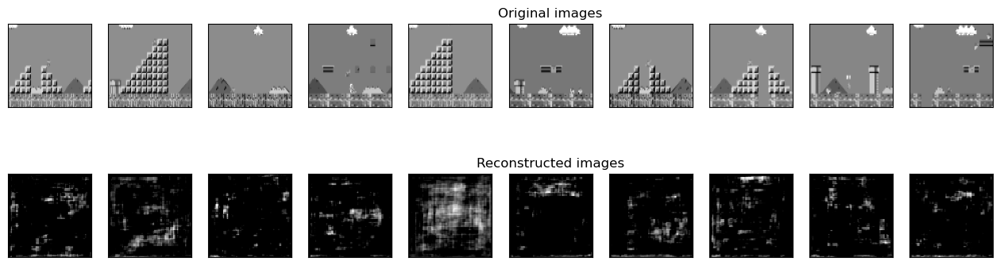

 88%|████████▊ | 88/100 [1:37:11<13:05, 65.45s/it]

epoch, train loss:  87 11470.9071875
Avg VAE/SIAM loss:  10117.3061015625 0.7345108284950256


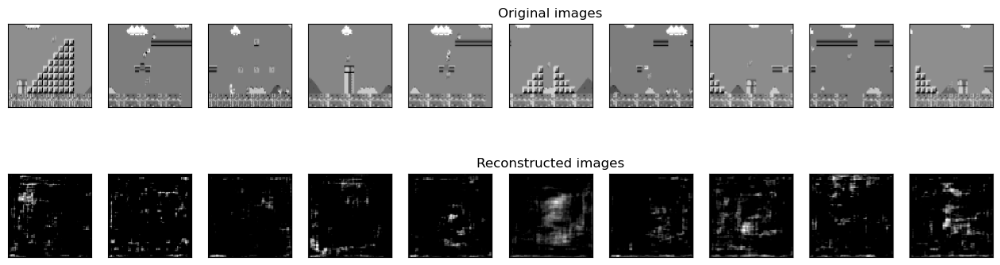

 89%|████████▉ | 89/100 [1:38:17<12:00, 65.49s/it]

epoch, train loss:  88 11219.0723125
Avg VAE/SIAM loss:  10098.3160859375 0.78642653298378


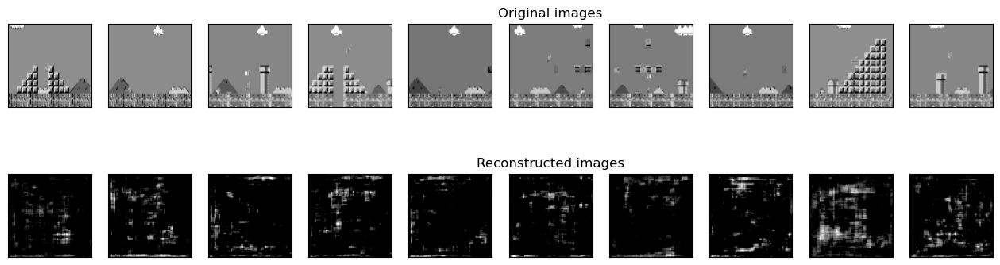

 90%|█████████ | 90/100 [1:39:22<10:54, 65.41s/it]

epoch, train loss:  89 11277.9559296875
Avg VAE/SIAM loss:  10160.526953125 0.7200792223215103


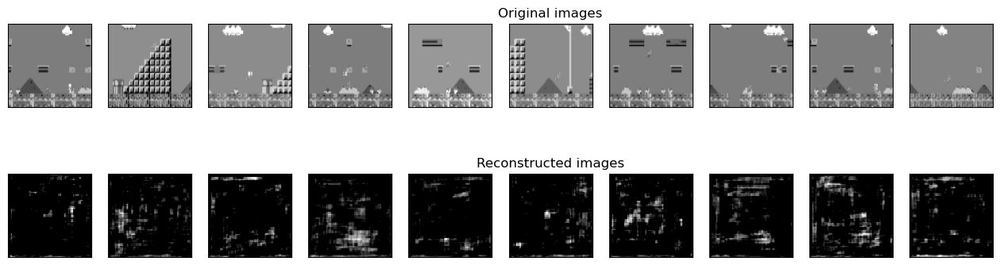

 91%|█████████ | 91/100 [1:40:27<09:48, 65.42s/it]

epoch, train loss:  90 11240.6458125
Avg VAE/SIAM loss:  10199.098578125 0.8013715622425079


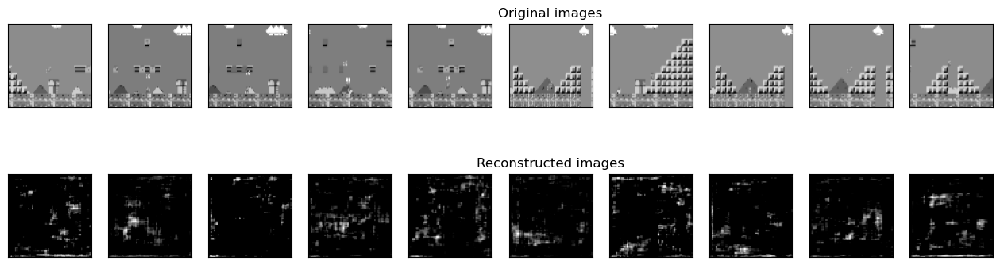

 92%|█████████▏| 92/100 [1:41:33<08:43, 65.43s/it]

epoch, train loss:  91 11401.1558984375
Avg VAE/SIAM loss:  10179.613453125 0.6846089537143707


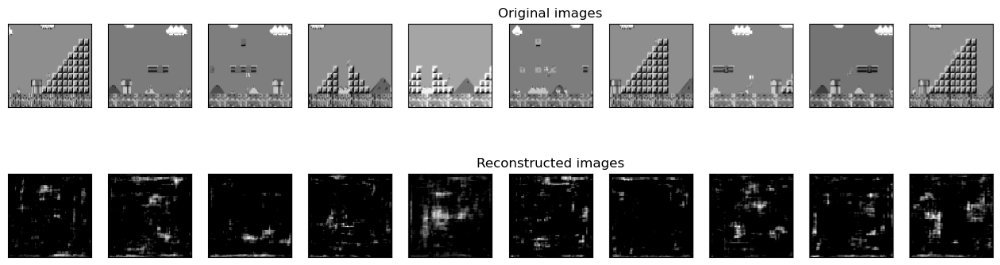

 93%|█████████▎| 93/100 [1:42:38<07:37, 65.41s/it]

epoch, train loss:  92 11206.526875
Avg VAE/SIAM loss:  10143.6435234375 0.6368999397754669


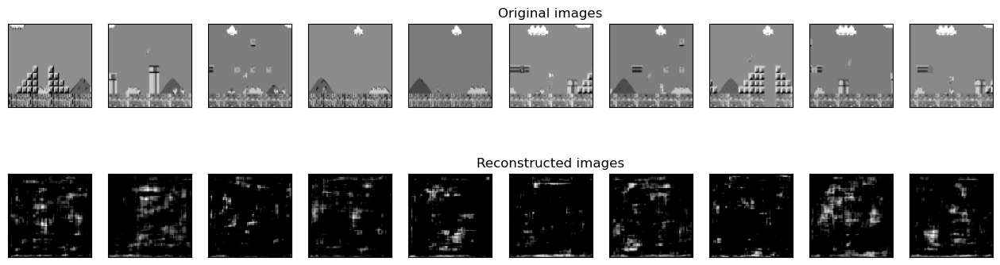

 94%|█████████▍| 94/100 [1:43:44<06:32, 65.43s/it]

epoch, train loss:  93 11098.993421875
Avg VAE/SIAM loss:  10186.146328125 0.853610475063324


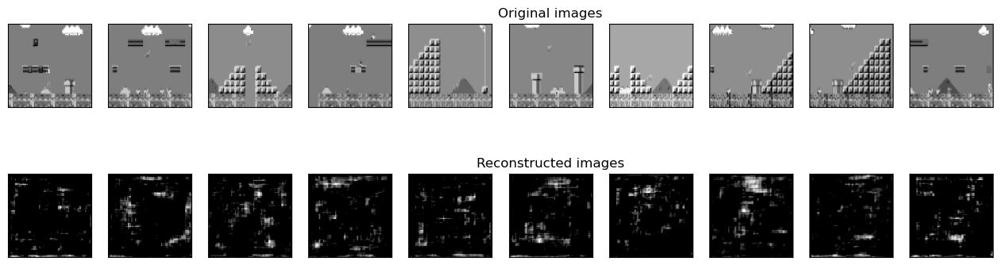

 95%|█████████▌| 95/100 [1:44:49<05:27, 65.44s/it]

epoch, train loss:  94 11466.56203125
Avg VAE/SIAM loss:  10123.9633046875 0.800037264585495


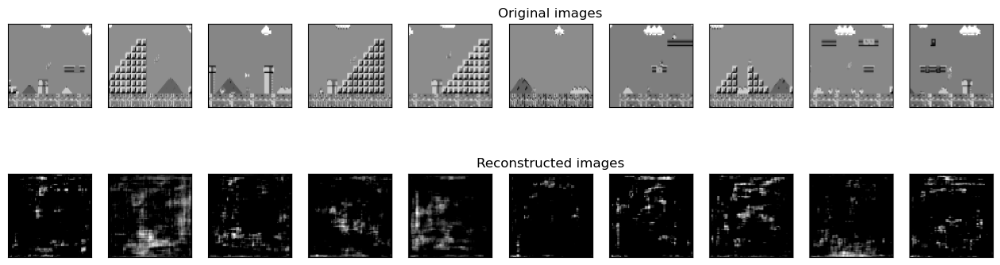

 96%|█████████▌| 96/100 [1:45:55<04:21, 65.43s/it]

epoch, train loss:  95 11324.0192421875
Avg VAE/SIAM loss:  10206.1341796875 0.7293585314750671


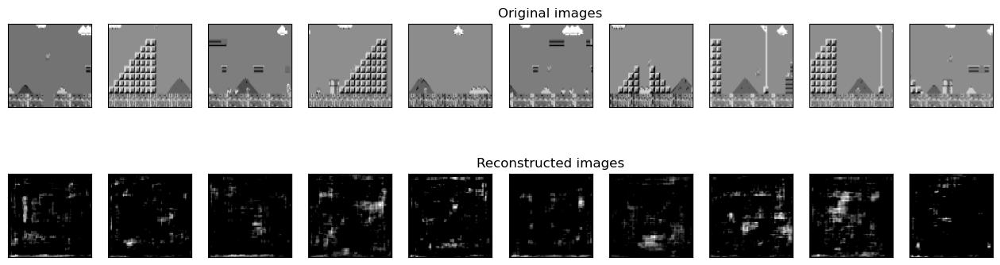

 97%|█████████▋| 97/100 [1:47:00<03:16, 65.43s/it]

epoch, train loss:  96 11300.17196875
Avg VAE/SIAM loss:  10187.3983984375 0.8301241850852966


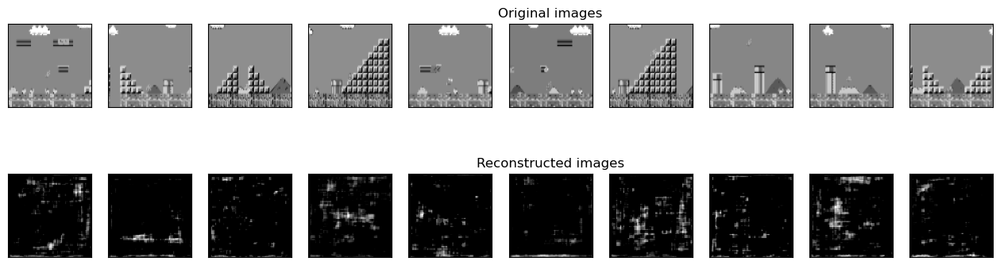

 98%|█████████▊| 98/100 [1:48:05<02:10, 65.40s/it]

epoch, train loss:  97 11432.58465625
Avg VAE/SIAM loss:  10232.3006953125 0.7929745264053345


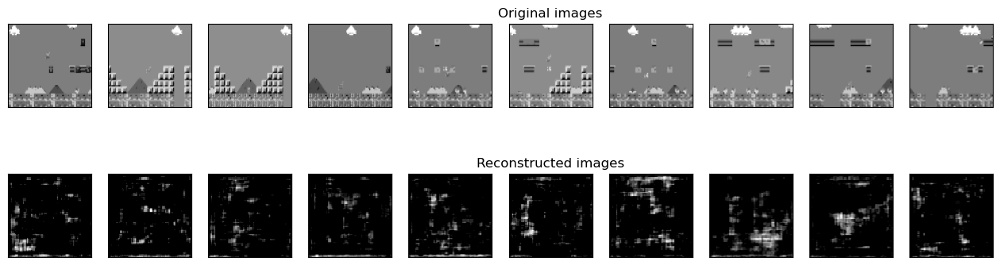

 99%|█████████▉| 99/100 [1:49:11<01:05, 65.40s/it]

epoch, train loss:  98 11421.76246875
Avg VAE/SIAM loss:  10147.9580703125 0.766704359292984


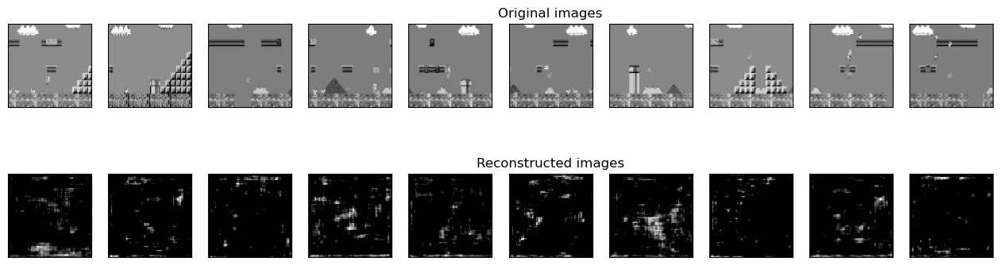

100%|██████████| 100/100 [1:50:16<00:00, 66.17s/it]

epoch, train loss:  99 11298.0146015625


In [33]:
num_epochs = 100
torch.autograd.set_detect_anomaly(True)
for epoch in tqdm(range(num_epochs)):
   train_loss = train_siamese_epoch(vae,device,train_loader,optimizer, criterion,beta =1.5,lbda=1500)
   #val_loss = test_epoch(vae,device,test_loader, beta = 1.5)
   #print('\n EPOCH {}/{} \t train loss {:.3f} \t val loss {:.3f}'.format(epoch + 1, num_epochs,train_loss,val_loss))
   plot_ae_outputs(vae.encoder,vae.decoder,n=10)
   print('epoch, train loss: ', epoch, train_loss)

In [34]:
torch.save(vae, 'mario_svae.pt')

In [14]:
vae  = torch.load("mario_svae.pt")
vae.eval()

VAE(
  (encoder): ResNet18Enc(
    (conv1): Conv2d(4, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (layer1): Sequential(
      (0): BasicBlockEnc(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (shortcut): Sequential()
      )
      (1): BasicBlockEnc(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    

# t-SNE for Pre-trained Encoder

In [15]:
acts = {0:'NOOP',1:'RIGHT',2:'RIGHT+A',3:'RIGHT+B',4:'RIGHT+A+B',5:'A',6:'LEFT'}
encoded_samples = []
for sample in tqdm(test_expert_dataset):
    img = torch.FloatTensor(sample[0]).unsqueeze(0).to(device)
    label = sample[1]
    # Encode image
    vae.eval()
    with torch.no_grad():
        encoded_img  = vae.encoder(img)
    # Append to list
    encoded_img = encoded_img.flatten().cpu().numpy()
    encoded_sample = {f"Enc. Variable {i}": enc for i, enc in enumerate(encoded_img)}
    encoded_sample['label'] = acts[label]
    encoded_samples.append(encoded_sample)
    
encoded_samples = pd.DataFrame(encoded_samples)
encoded_samples


from sklearn.manifold import TSNE
import plotly.express as px

px.scatter(encoded_samples, x='Enc. Variable 0', y='Enc. Variable 1', color=encoded_samples.label.astype(str), opacity=0.7)

100%|██████████| 2000/2000 [00:45<00:00, 43.82it/s] 


In [16]:
#beta = 1.5
tsne = TSNE(n_components=2)
tsne_results = tsne.fit_transform(encoded_samples.drop(['label'],axis=1))

fig = px.scatter(tsne_results, x=0, y=1, color=encoded_samples.label.astype(str),labels={'0': 'tsne-2d-one', '1': 'tsne-2d-two'})
fig.show()

# Downstream Training

In [18]:
# dataset for downstream 
# RUN THIS FOR DOWNSTREAM TRAINING

train_size = int(0.8 * len(expert_dataset))
#push_size = int(0.1 * len(expert_dataset))
test_size = int(0.2 * len(expert_dataset))

train_expert_dataset, test_expert_dataset = random_split(
    expert_dataset, [train_size, test_size]
)



kwargs = {"num_workers": 0, "pin_memory": False}
train_loader = th.utils.data.DataLoader(
        dataset=train_expert_dataset, batch_size=32, shuffle=False, **kwargs
)
test_loader = th.utils.data.DataLoader(
    dataset=test_expert_dataset, batch_size=32, shuffle=False, **kwargs
)
  

In [38]:
def train_ds_epoch(net, 
          train_loader, 
          optimizer,
          iso_coeff=10,
          clst_coeff =0.,
          sep_coeff = 0.,
          rep_coeff = 0.,
          validation = False,
          resnetbc=False
         ):
    running_CE = 0.
    running_iso = 0.
    running_clst= 0.
    running_sep = 0.
    running_rep = 0.
    
    if not resnetbc:
        I = torch.eye(net.isometry.weight.data.shape[0]).to(device)
        max_dist = net.prototype_shape[1]
    
    criterion = nn.CrossEntropyLoss()   
    
    correct = 0
    total = 0
    for (states, actions) in train_loader:
        states = states.to(device)
        actions = actions.to(device)
        
        if not validation:
            optimizer.zero_grad()
        
        if not resnetbc:
            logits, min_distances = net(states.float())
        else:
            logits = net(states.float())
        
        _, predicted = torch.max(logits.data, 1)
        total += actions.size(0)
        correct += (predicted == actions).sum().item()
            

        if not resnetbc:
            #cluster cost
            # it's the mean of the min distances between encoding and prototypes of same class
            # where min is taken over batch dimension
            # torch.t(model.prototype_action_identity[:,target]) is distance matrix with entries
            # for prototypes of wrong class zeroed out
            # torch.max((max_dist - min_distances) * prototypes_of_correct_class, dim=1
            # gives you the min distances between encodings and correct protos over 
            # batch dim
            prototypes_of_correct_class = torch.t(net.prototype_action_identity.to(device)[:,actions].to(device)).to(device)
            inverted_distances, _ = torch.max((max_dist - min_distances) * prototypes_of_correct_class, dim=1)
            clst_cost = torch.mean(max_dist - inverted_distances)

            #separation cost
            prototypes_of_wrong_class = 1 - prototypes_of_correct_class
            inverted_distances_to_nontarget_prototypes, _ = torch.max((max_dist - min_distances) * prototypes_of_wrong_class, dim=1)
            sep_cost = torch.mean(max_dist - inverted_distances_to_nontarget_prototypes)

            #avg clustering cost
            #avg_sep = torch.sum(min_distances * prototypes_of_wrong_class,dim=1) / torch.sum(prototypes_of_wrong_class,dim=1)
            #avg_sep = torch.mean(avg_sep)

            # Rep term
            rep = torch.sum(torch.min(min_distances, dim=0)[0])
            
            CE = criterion(logits, actions.long())

            A = net.isometry.weight.data
            iso_penalty = torch.linalg.matrix_norm(torch.mm(A.T, A) - I, ord = 'fro')**2 # 2 gives operator norm

            loss = CE + iso_coeff * iso_penalty + clst_coeff * clst_cost - sep_coeff * sep_cost + rep_coeff * rep 

            running_CE += CE.item()
            running_iso += iso_penalty.item()
            running_clst += clst_cost.item()
            running_sep += sep_cost.item()
            running_rep += rep.item()
        else:
            loss = criterion(logits, actions.long())
            running_CE += loss.item()

        if not validation:
            loss.backward()
            optimizer.step()
     
    if not validation:
        print('Train Acc: %d %%' % (100 * correct / total))
    else:
        print('Val Acc: %d %%' % (100 * correct / total))
    return running_CE, running_iso, running_clst, running_sep, running_rep

In [20]:
def train_iso(net, 
          train_loader, 
          val_loader,
          iso_coeff=10,
          clst_coeff =0.,
          sep_coeff = 0.,
          rep_coeff = 0.,
          push_interval=None,
          push_epochs=100,
          n_epochs=100,
          main_lr = 1e-6,
          pruned=False,
          lr_sched=False,
          resnetbc=False
         ):
    criterion = nn.CrossEntropyLoss()
    net_optimizer = optim.Adam(net.parameters(), lr=main_lr)
    if push_interval is not None:
        ll_optimizer = optim.Adam(net.last_layer.parameters(), lr=1e-5)
    else:
        ll_optimizer = None
    if lr_sched:
        if pruned:
            sched = StepLR(ll_optimizer, 10, .8)
        else:
            sched = StepLR(net_optimizer, 10, .8)
    
    
    early_stopping = EarlyStopping(patience=50, verbose=True)
    
    #wandb.init(project='mario')
    #wandb.watch(net)
    
    for i in range(n_epochs):
        net.train()
        if pruned:
            (ce,iso,clst,sep,rep) = train_ds_epoch(net, 
                                                   train_loader, 
                                                   ll_optimizer,
                                                   iso_coeff,
                                                   clst_coeff,
                                                   sep_coeff,
                                                   rep_coeff,
                                                   validation=False,
                                                   resnetbc=resnetbc)
        else:
            (ce,iso,clst,sep,rep) = train_ds_epoch(net, 
                                                   train_loader, 
                                                   net_optimizer,
                                                   iso_coeff,
                                                   clst_coeff,
                                                   sep_coeff,
                                                   rep_coeff,
                                                   validation=False,
                                                   resnetbc=resnetbc)         
        #wandb.log({'CE':ce,'Iso':iso,'Clst':clst,'Sep':sep,'Rep':rep})
        print('\nEpoch', i, {'CE':ce,'Iso':iso,'Clst':clst,'Sep':sep,'Rep':rep})
        
        if push_interval is not None:
            if i > 0 and i % push_interval == 0:
                # push
                prots = save_proto(net, train_loader, project=True, device=device)
                
                #freeze isometry
                for param in net.isometry.parameters():
                    param.requires_grad = False
                #freeze protos
                net.prototype_vectors.requires_grad = False
                
                for j in range(push_epochs):
                    (ce,iso,clst,sep,rep) = train_ds_epoch(net, 
                                                           train_loader, 
                                                           ll_optimizer,
                                                           iso_coeff,
                                                           clst_coeff,
                                                           sep_coeff,
                                                           rep_coeff,
                                                           validation=False,
                                                           resnetbc=resnetbc)
                    #wandb.log({'ll CE':ce,'ll Iso':iso,'ll Clst':clst,'ll Sep':sep,'ll Rep':rep})
                    
                # train isometry
                for param in net.isometry.parameters():
                    param.requires_grad = True
                
                # train protos
                net.prototype_vectors.requires_grad = True
                    
        # validation step
        net.eval()
        (ce,iso,clst,sep,rep) = train_ds_epoch(net, 
                                               val_loader, 
                                               net_optimizer,
                                               iso_coeff,
                                               clst_coeff,
                                               sep_coeff,
                                               rep_coeff,
                                               validation=True,
                                               resnetbc=resnetbc)
        early_stopping(ce, net)
        #wandb.log({'val CE':ce,'val Iso':iso,'val Clst':clst,'val Sep':sep,'val Rep':rep})
        
        if early_stopping.early_stop:
            print('early Stopping')
            break
    net.load_state_dict(torch.load('checkpoint.pt'))
    
    
    # final push
    print('Doing final push!')
    if not resnetbc:
        prots = save_proto(net, train_loader, project=True, device=device)
                
        #freeze isometry
        for param in net.isometry.parameters():
            param.requires_grad = False
        #freeze protos
        net.prototype_vectors.requires_grad = False
                
        for j in range(push_epochs):
            (ce,iso,clst,sep,rep) = train_ds_epoch(net, 
                                                      train_loader, 
                                                      ll_optimizer,
                                                      iso_coeff,
                                                      clst_coeff,
                                                      sep_coeff,
                                                      rep_coeff,
                                                      validation=False,
                                                      resnetbc=resnetbc)
            #wandb.log({'ll CE':ce,'ll Iso':iso,'ll Clst':clst,'ll Sep':sep,'ll Rep':rep})

    if lr_sched:
        sched.step()
    
    return net

In [21]:
def test(net, device, test_loader):
    net.eval()

    total = 0.
    correct = 0.
    for (states, actions) in test_loader:
        states = states.to(device)
        actions = actions.to(device)

        logits, _ = net(states)

        _, predicted = torch.max(logits.data, 1)
        total += actions.size(0)
        correct += (predicted == actions).sum().item()

    acc = 100 * (correct / total)
    return acc


In [44]:
def flip_fidelity(net,
                   world=1,
                   stage=1,
                   action_type='simple',
                   saved_path='supermarioagent',
                   output_path='output',
                   n_flip=int(10),
                   num_interactions=int(10)):
    if torch.cuda.is_available():
        torch.cuda.manual_seed(123)
    else:
        torch.manual_seed(123)
    if action_type == "right":
        actions = RIGHT_ONLY
    elif action_type == "simple":
        actions = SIMPLE_MOVEMENT
    else:
        actions = COMPLEX_MOVEMENT
    env = create_train_env(world, stage, actions,output_path=output_path)
    model = PPO(env.observation_space.shape[0], len(actions))
    if torch.cuda.is_available():
        model.load_state_dict(torch.load("{}/ppo_super_mario_bros_{}_{}".format(saved_path, world, stage)))
        model.cuda()
    else:
        model.load_state_dict(torch.load("{}/ppo_super_mario_bros_{}_{}".format(saved_path, world, stage),
                                         map_location=lambda storage, loc: storage))
    model.eval()

    state_shape = env.observation_space.shape
    action_shape = env.action_space.shape
    
    #expert_observations = np.empty((num_interactions,4,84,84))
    max_size = max(n_flip, num_interactions) + 1
    expert_actions = np.empty((max_size,) + env.action_space.shape)
    agent_actions = np.empty((max_size,) + env.action_space.shape)
    #episode_schedule = np.empty((num_interactions,2))
    
    ep_number = 0
    step_number = 0
    correct = 0
    total = 0
    flip_correct = 0
    flip_total = 0
    while flip_total < n_flip and step_number < num_interactions:
        print(step_number, num_interactions)
        state = torch.from_numpy(env.reset())
        while flip_total < n_flip and step_number < num_interactions:#True:
            if torch.cuda.is_available():
                state = state.cuda()
            try:
                logits, value = model(state)
            except Exception as e:
                logits = model(state)
            policy = F.softmax(logits, dim=1)
            
            # expert action
            if random.random() < .995:
                action = torch.argmax(policy).item()
            else:
                action = np.random.choice(7,size=1,p=policy.detach().cpu().numpy()[0])[0]
            
            # crop for agent
            state = torchvision.transforms.functional.crop(state, 15,0,84-15,84)
            state = torchvision.transforms.functional.resize(state,(84,84))       
                
            # agent action
            try:
                l, _ = net(state)
            except Exception as e:
                l = net(state)
            agent_policy = F.softmax(l, dim=1)
            agent_action = torch.argmax(agent_policy).item()
            
            if action == agent_action:
                correct += 1
            total += 1
            
            
            if step_number >= 1  and action != expert_actions[step_number-1]:
                flip_total += 1
                if agent_action == action and agent_actions[step_number-1] == expert_actions[step_number-1]:
                    flip_correct += 1
            
            state, reward, done, info = env.step(action)
            
            # save data
            #expert_observations[step_number] = state#.transpose(0,3,1,2) 
            expert_actions[step_number] = action
            agent_actions[step_number] = agent_action
            #episode_schedule[step_number] = np.array([ep_number, step_number])
            
            state = torch.from_numpy(state)
            env.render()
            
            step_number += 1
            
            if info["flag_get"]:
                print("World {} stage {} completed".format(world, stage))
                ep_number += 1
                break
                
    
    total_fidelity = (correct / total) * 100.
    flip_fidelity = (flip_correct / flip_total) * 100.
    env.close()
    print('got', flip_total, ' flip points')
    return total_fidelity, flip_fidelity
#if __name__ == "__main__":
#    opt = get_args()
#    test(opt)


# Train ResNet-BC

In [23]:
# train bbox
bbox = models.resnet18(pretrained=False)
bbox.conv1 = nn.Conv2d(4, 64, kernel_size=7,stride=2,padding=3,bias=False)
bbox.fc = nn.Linear(512,7)
bbox=bbox.to(device)

E:\programming\anaconda3\envs\cuda\lib\site-packages\torchvision\models\_utils.py:208: UserWarning:

The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.

E:\programming\anaconda3\envs\cuda\lib\site-packages\torchvision\models\_utils.py:223: UserWarning:

Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.



In [24]:
bbox = train_iso(bbox, 
      train_loader, 
      test_loader, 
      iso_coeff=1e-8,#.01,
      clst_coeff=4e-4,
      sep_coeff=1e-4,
      rep_coeff=1e-5,
      n_epochs=2,#1000
      main_lr=5e-6,
      push_interval=None,
      push_epochs=0,#20
      resnetbc=True)

Train Acc: 66 %

Epoch 0 {'CE': 314.518377661705, 'Iso': 0.0, 'Clst': 0.0, 'Sep': 0.0, 'Rep': 0.0}
Val Acc: 91 %
Validation loss decreased (inf --> 46.103607).  Saving model ...
Train Acc: 94 %

Epoch 1 {'CE': 125.9304903447628, 'Iso': 0.0, 'Clst': 0.0, 'Sep': 0.0, 'Rep': 0.0}
Val Acc: 98 %
Validation loss decreased (46.103607 --> 14.837125).  Saving model ...
Doing final push!


# Train ProtoX

In [25]:
# Make Prototype network
net = ProtoIsoResNet(prototype_shape=(350,512*3*3),num_actions=7,tl=False, sim_method=0)# MY sim method
net.isometry.weight.data.copy_(torch.eye(512*3*3))

# Load encoder from pre-training (change enc40.pt to whatever the pre-trained encoder is) 
encoder_state = torch.load('mario_svae.pt').encoder.state_dict()
#encoder_state = enc.state_dict()
net.load_state_dict(encoder_state, strict=False)
net = net.to(device)

# Freeze encoder
for parm in net.convunit.parameters():
    parm.requries_grad = False

net = net.to(device)

THIS PROTOPNET IS USING SIM SCORES FOR LOGITS
Doing weight init
Setting incorrect weight strength due to positive linear!


In [27]:
device

device(type='cuda')

In [39]:
net = train_iso(net, 
      train_loader, 
      test_loader, 
      iso_coeff=1e-8,#.01,
      clst_coeff=4e-4,
      sep_coeff=1e-4,
      rep_coeff=1e-5,
      n_epochs=2,#1000
      main_lr=5e-6,
      push_interval=25,
      push_epochs=0)#20)
torch.save(net, 'mario_ds.pt')

Train Acc: 35 %

Epoch 0 {'CE': 468.25699293613434, 'Iso': 470.99229024653323, 'Clst': 16891.70524597168, 'Sep': 16833.43194580078, 'Rep': 3846951.923828125}
Val Acc: 39 %
Validation loss decreased (inf --> 115.420703).  Saving model ...
Train Acc: 37 %

Epoch 1 {'CE': 451.11259853839874, 'Iso': 2034.2323627471924, 'Clst': 15925.381454467773, 'Sep': 15886.37094116211, 'Rep': 3072653.4560546875}
Val Acc: 39 %
Validation loss decreased (115.420703 --> 111.382746).  Saving model ...
Doing final push!
Copying new prototypes into network


# ProtoX t-SNE

In [40]:
encoded_samples = []
for sample in tqdm(test_expert_dataset):
    img = torch.FloatTensor(sample[0]).unsqueeze(0).to(device)
    label = sample[1]
    # Encode image
    net.eval()
    with torch.no_grad():
        encoded_img, _  = net.push_forward(img)
    # Append to list
    encoded_img = encoded_img.flatten().cpu().numpy()
    encoded_sample = {f"Enc. Variable {i}": enc for i, enc in enumerate(encoded_img)}
    encoded_sample['label'] = acts[label]
    encoded_samples.append(encoded_sample)
    
encoded_samples = pd.DataFrame(encoded_samples)
encoded_samples


from sklearn.manifold import TSNE
import plotly.express as px

px.scatter(encoded_samples, x='Enc. Variable 0', y='Enc. Variable 1', color=encoded_samples.label.astype(str), opacity=0.7)

100%|██████████| 2000/2000 [00:15<00:00, 128.62it/s]


In [41]:
#beta = 1.5
tsne = TSNE(n_components=2)
tsne_results = tsne.fit_transform(encoded_samples.drop(['label'],axis=1))

fig = px.scatter(tsne_results, x=0, y=1, color=encoded_samples.label.astype(str),labels={'0': 'tsne-2d-one', '1': 'tsne-2d-two'})
fig.show()

# Evaluate fidelity

In [42]:
test(net,device,eval_loader)

34.9

In [45]:
tf, ff = flip_fidelity(bbox,output_path=None,n_flip=10000,num_interactions=30000)
print(tf, ff)

mario-src.env : env create
0 30000


E:\programming\anaconda3\envs\cuda\lib\site-packages\torchvision\transforms\functional.py:1603: UserWarning:

The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).

E:\programming\anaconda3\envs\cuda\lib\site-packages\pyglet\image\codecs\wic.py:289: UserWarning:

[WinError -2147417850] Cannot change thread mode after it is set



World 1 stage 1 completed
322 30000
World 1 stage 1 completed
644 30000
World 1 stage 1 completed
966 30000
World 1 stage 1 completed
1288 30000
World 1 stage 1 completed
1610 30000
World 1 stage 1 completed
1932 30000
World 1 stage 1 completed
2254 30000
World 1 stage 1 completed
2576 30000
World 1 stage 1 completed
2898 30000
World 1 stage 1 completed
3220 30000
World 1 stage 1 completed
3723 30000
World 1 stage 1 completed
4045 30000
World 1 stage 1 completed
5623 30000
World 1 stage 1 completed
5945 30000
World 1 stage 1 completed
6267 30000
World 1 stage 1 completed
6589 30000
World 1 stage 1 completed
6913 30000
World 1 stage 1 completed
7235 30000
World 1 stage 1 completed
7557 30000
World 1 stage 1 completed
7879 30000
World 1 stage 1 completed
8201 30000
World 1 stage 1 completed
8523 30000
World 1 stage 1 completed
8845 30000
World 1 stage 1 completed
9167 30000
World 1 stage 1 completed
9512 30000
World 1 stage 1 completed
9834 30000
World 1 stage 1 completed
10156 30000
Wor

# Make Pruned Network

In [46]:
eq = prot_equivs(net)
unique_ix = list(eq)
        
pruned_net = merge_weights(net,device,eq,unique_ix,action_filter=False)

# Visualization Fns

In [47]:
def top_k_prots(net, oidx, action_filter=False, k=3, score_sort=False, sim_method=0, act=None):
    enc, dist = net(torch.FloatTensor(expert_observations[oidx]).unsqueeze(0).to(device))
    
    if sim_method == 1:
        sim = torch.log( (1 + dist) / (dist + 1e-10) )[0]#[pidx]
    else:
        sim = torch.exp(dist * -.05)[0]
    try:
        fcl = net.last_layer.weight.data.T
    except Exception as e:
        fcl = torch.exp(net.last_layer.log_weight.data.T)
        
    if act is None:
        action = expert_actions[oidx].item()
    else:
        action = act
    if not score_sort:
        topk_idx = torch.topk(sim, k=k)
    else:
        scores = sim * net.last_layer.weight.data[int(action)]
        topk_idx = torch.topk(scores,k=k)
        
    # TODO FIX NONES
    idx = [topk_idx[1][j].item() for j in range(k)]
    sims = [sim[topk_idx[1][j].item()] for j in range(k)]
    fcs = [fcl[int(idx[j])][int(action)].item() for j in range(k)]
        
    return idx, sims, fcs


In [48]:
def prot_rep(net, ix, push_loader,project=False,sim_method=0,max_samples=5000):
    #color_prots = [None for i in range(net.prototype_vectors.shape[0])]
    #new_pvec = torch.FloatTensor(net.prototype_vectors.shape)

    for pidx in [ix]:#tqdm(range(net.prototype_vectors.shape[0])):
        best_prot = None
        #best_idx = 0
        ct = 0
        best_sim = -1*float('inf')
        best_idx = -1
        for batch, (x, actions) in enumerate(push_loader):
            batch_size = x.shape[0]
            
            x = x.to(device)
            enc, dist = net.push_forward(x)
        
            if sim_method == 1:
                sim = torch.log( (1 + dist) / (dist + 1e-10) )#[0][pidx]
            else:
                sim = torch.exp(-.05 * dist)#[0][pidx]

            sim = sim[:,pidx]
                
            bat_ix = torch.argmax(sim).item()
            
            data_ix = bat_ix + ct
            
            top_sim = sim[bat_ix].item()
            
            if top_sim > best_sim:
                best_prot = enc[bat_ix]
                #color_prots[pidx] = data_ix#color_observations[data_ix]
                best_idx = data_ix
                best_sim = top_sim

                
            ct += batch_size
            
            if ct > max_samples:
                break
    print('prototype action is ',acts[expert_actions[data_ix]])
    return color_observations[data_ix], best_prot

In [49]:
def explain_color(net,
                 oidx,
                 push_loader,
                 action_filter=False,
                 k=3,
                 fname=None,
                 score_sort=False,
                 sim_method=0):
    net.eval()
    acts = {0:'NOOP',1:'RIGHT',2:'RIGHT+A',3:'RIGHT+B',4:'RIGHT+A+B',5:'A',6:'LEFT'}

    num_prototypes_per_action = net.num_prototypes // net.num_actions
    
    fig, axes = plt.subplots(1,1+k,figsize=(30,30))
    
    action = expert_actions[oidx].item()
    
    out, _ = net(torch.FloatTensor(expert_observations[oidx]).unsqueeze(0).to(device))
    #print(out.shape)
    logit = out[0][int(action)].item()
    # show input
    axes[0].imshow(color_observations[oidx].astype(int))
    if k > 1:
        axes[0].set_title('Input w/ action: ' + acts[action],size=25)# + '\nTotal points: '+str(logit),size=25)
    else:
        axes[0].set_title('Input w/ action: ' + acts[action] + '\nat t='+str(oidx),size=40)# + '\nTotal points: '+str(logit),size=25)
    axes[0].set_xticklabels([])
    axes[0].set_yticklabels([])
    axes[0].set_xticks([])
    axes[0].set_yticks([])
    axes[0].axis('off')
    
    # show prots
    top_k_ix, sims, fcs = top_k_prots(net, oidx, 
                                      action_filter=action_filter,
                                      k=k,
                                      sim_method=sim_method,
                                      score_sort=score_sort)
    for j in range(1,1+k):
        im, _ = prot_rep(net, top_k_ix[j-1], push_loader)
        axes[j].imshow(im.astype(np.uint8))
        axes[j].set_xticklabels([])
        axes[j].set_yticklabels([])
        axes[j].set_xticks([])
        axes[j].set_yticks([])
        axes[j].axis('off')
        if k > 1:
            axes[j].set_title('Sim score: {:.2f} \n'.format(sims[j-1])+acts[action]+' score: {:.2f}\nPoints: {:.2f}'.format(fcs[j-1],sims[j-1]*fcs[j-1]),size=25)
        else:
             axes[j].set_title('Most Similar Prototype'.format(sims[j-1], fcs[j-1],sims[j-1]*fcs[j-1]),size=40)

In [50]:
def color_ball(net, oidx,min_sim, n_samples=1000,alpha=.2,Af=True):        
    fig, axes = plt.subplots(1,2)
    axes[0].imshow(color_observations[oidx].astype(int))
    
    if Af:
        enc1, _ = net.push_forward(torch.FloatTensor(expert_observations[oidx]).unsqueeze(0).to(device)) 
    else:
        enc1 = net.encoder(torch.FloatTensor(expert_observations[oidx]).unsqueeze(0).to(device))
        
    best_list = []
    for i in range(n_samples):
        if Af:
            enc2, _ = net.push_forward(torch.FloatTensor(expert_observations[i]).unsqueeze(0).to(device)) 
        else:
            enc2 = net.encoder(torch.FloatTensor(expert_observations[i]).unsqueeze(0).to(device))
            
        d = torch.norm(enc1 - enc2)
        sim = torch.exp(-.05 * d)
        
        if sim > min_sim:
            best_list.append(i)
            
    print('Found ', len(best_list))
    for i, ix in enumerate(best_list):
        axes[1].imshow(color_observations[ix].astype(int),alpha=alpha)
    for i in [0,1]:        
        axes[i].set_xticklabels([])
        axes[i].set_yticklabels([])
        axes[i].set_xticks([])
        axes[i].set_yticks([])
        axes[i].axis('off')
    axes[0].set_title('Input')
    axes[1].set_title('Top 30\n Most Similar States')

# Compare similar states between Af and f

In [51]:
Af = torch.load('mario_ds.pt')
f = torch.load('mario_svae.pt')

Found  0


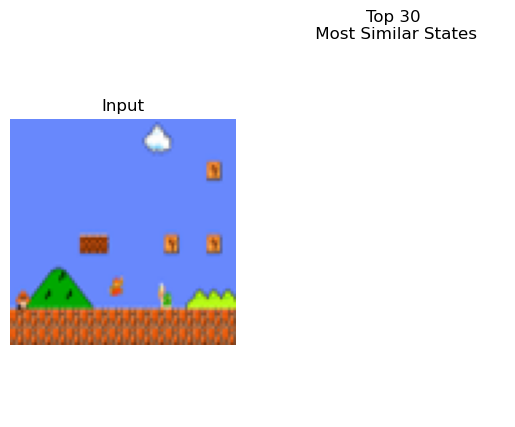

In [52]:
color_ball(f, oidx=137, n_samples=1000, min_sim=.95,alpha=.4,Af=False)

Found  3


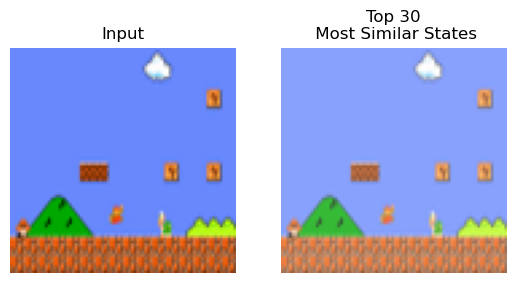

In [53]:
color_ball(net, oidx=137, n_samples=1000, min_sim=.45,alpha=.4)

# Explain step 32 with pruned net

prototype action is  RIGHT+B
prototype action is  RIGHT+B
prototype action is  RIGHT+B


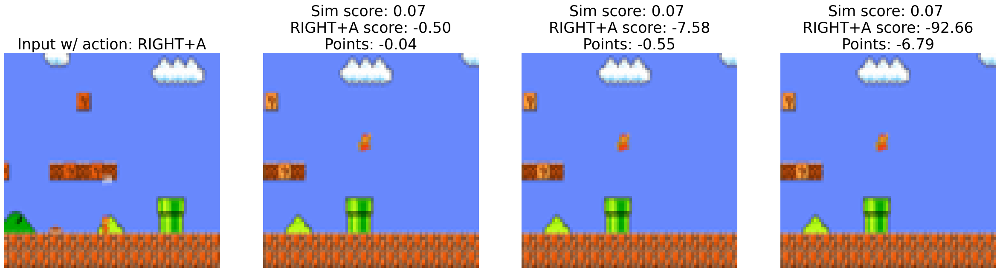

In [54]:
explain_color(pruned_net.to(device),32, train_loader, action_filter=False, k=3,fname=None,sim_method=0,score_sort=True)

# Make an Importance Map for step 32

In [55]:
def importance(net_path, x,xrep, pidx, p, mask_size=7,post_proc=True):
    # get base similarity of x with p
    net = torch.load(net_path).to(device)
    
    logits, distances = net(torch.FloatTensor(x).unsqueeze(0).to(device))
    sims = torch.exp(-.05 * distances)[0]
    base_sim = sims[pidx].item()
    
    heatmap = np.zeros((84,84))
    
    r = mask_size // 2
    for i in range(-r, 84 - r):
        for j in range(-r, 84 - r):
            # reload net just in case
            net_clone = torch.load(net_path).to(device)
            
            # load prototype image representation
            xp = deepcopy(p)
            
            # mask each channel of prototype xp
            for k in range(4):      
                xmin = max(0, i)
                xmax = min(i + mask_size, 84)
                ymin = max(0, j)
                ymax = min(j+mask_size, 84)
                xp[k][xmin:xmax, ymin:ymax] = 0

            # encode prototype 
            net = torch.load(net_path).to(device)
            enc, _ = net.push_forward(torch.FloatTensor(xp).unsqueeze(0).to(device))
            
            # get new similarity of x with xp
            d = torch.norm(enc - net.prototype_vectors[pidx].data)
            new_sim = torch.exp(-.05 * d).item()
            
            sim_diff = np.abs(new_sim - base_sim)
            
            # set middle pixel to absolute similarity difference
            heatmap[xmin:xmax, ymin:ymax] += sim_diff
            
    heatmap /= mask_size**2
            
    fig,ax = plt.subplots(1,3,figsize=(10,30))
    ax[0].imshow(xrep.astype(int))
    ax[0].set_title('Input')
    ax[0].axis('off')
    
    ax[1].imshow(color_observations[data_ixs[pidx]].astype(int))
    ax[1].set_title('Prototype')
    ax[1].axis('off')
    
    heatmap_org = deepcopy(heatmap)
    if post_proc:
        heatmap[heatmap < .95 * np.max(heatmap)] = 0
        kernel = np.ones((3,3),np.float32)/9
        heatmap = cv2.filter2D(heatmap,-1,kernel)
    ax[2].imshow(color_observations[data_ixs[pidx]].astype(int),alpha=1)
    ax[2].imshow(heatmap,alpha=.4,cmap='gist_heat')
    ax[2].set_title('Prototype Overlay')
    ax[2].axis('off')
    
    
    return heatmap_org
    

In [56]:
net = torch.load('mario_ds.pt')
_, distances = net(torch.FloatTensor(expert_observations[32]).unsqueeze(0).to(device))
pidx = torch.argmin(distances) # index of most similar prototype

In [57]:
gen_masks3('mario_ds.pt', 32, pidx, expert_observations[data_ixs[pidx]], mask_size=28)

NameError: name 'gen_masks3' is not defined